In [1]:
import drawing
import numpy as np

import os

import torch 
from torch import tensor
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
from tqdm import tqdm

import time

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

device = 'cuda:1' if torch.cuda.is_available() else 'cpu'
print(device)


n_output_mixtures = 20
n_attn_mixtures = 1
hidden_size = 128
input_size = 3
batch_size = 256
n_epochs = 1000
timestamps = 1200
lr = 1e-4
eps = 1e-6
model_name = "20210819_vae"
base_dir = "/u/home/lyrebird_code/handwriting_synthesis/model_checkpoints/"
embedding_size = None # To be set to 73 later


cuda:1


In [2]:
data_dir = "data"
data = [np.load(os.path.join(data_dir, '{}.npy'.format(i))) for i in ['x', 'x_len', 'c', 'c_len', 'w_id']]
strokes_og = data[0]
stroke_lens = data[1]
strings = data[2]
string_lens = data[3]
w_id = data[4]


def offsets_to_coords(offsets):
    """
    convert from offsets to coordinates
    """
    return np.concatenate([np.cumsum(offsets[:, :2], axis=0), offsets[:, 2:3]], axis=1)



def draw(offsets, name=None, padding = 10, plot_end_points=True):
    strokes = offsets_to_coords(offsets)
    
    fig, ax = plt.subplots(figsize=(12, 6))
    stroke = []
    for x, y, eos in strokes:
        stroke.append((x, y))
        if eos == 1:
            coords = list(zip(*stroke))
            ax.plot(coords[0], coords[1], 'k')
            if plot_end_points:
                ax.plot(x, y, 'ro')
            stroke = []
    if stroke:
        coords = list(zip(*stroke))
        ax.plot(coords[0], coords[1], 'k')
        stroke = []
    
    ax.set_xlim(strokes[:,0].min() - padding, strokes[:,0].max() + padding)
    ax.set_ylim(strokes[:,1].min() - padding, strokes[:,1].max() + padding)

    ax.set_aspect('equal')
    plt.axis("off")
    if not name:
        plt.show()
    else:
        plt.savefig(name)
    plt.close('all')

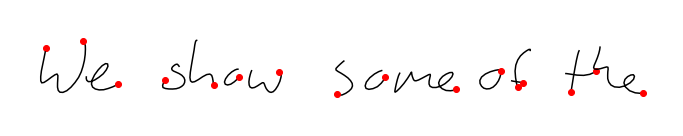

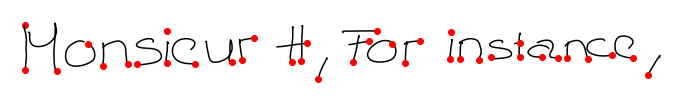

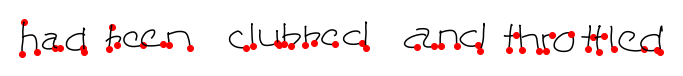

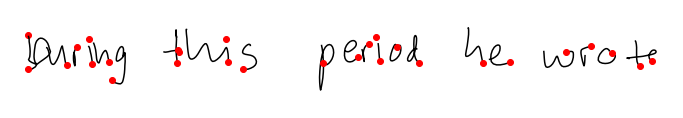

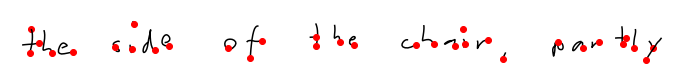

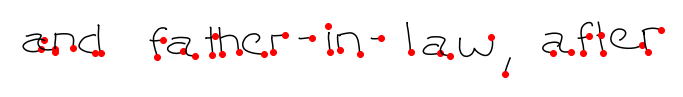

In [3]:
draw(strokes_og[23])
draw(strokes_og[230])
draw(strokes_og[231])
draw(strokes_og[223])
draw(strokes_og[123])
draw(strokes_og[233])

In [4]:
# for i in tqdm(range(len(strokes_og))):
#     draw(strokes_og[i],
#          name=f"data/images/0/{str(i)}.png",
#          padding=0,
#          plot_end_points=False)

In [5]:
! ls data/images/0/

10000.png  11533.png  2345.png	3878.png  5409.png  6941.png  8473.png
10001.png  11534.png  2346.png	3879.png  540.png   6942.png  8474.png
10002.png  11535.png  2347.png	387.png   5410.png  6943.png  8475.png
10003.png  11536.png  2348.png	3880.png  5411.png  6944.png  8476.png
10004.png  11537.png  2349.png	3881.png  5412.png  6945.png  8477.png
10005.png  11538.png  234.png	3882.png  5413.png  6946.png  8478.png
10006.png  11539.png  2350.png	3883.png  5414.png  6947.png  8479.png
10007.png  1153.png   2351.png	3884.png  5415.png  6948.png  847.png
10008.png  11540.png  2352.png	3885.png  5416.png  6949.png  8480.png
10009.png  11541.png  2353.png	3886.png  5417.png  694.png   8481.png
1000.png   11542.png  2354.png	3887.png  5418.png  6950.png  8482.png
10010.png  11543.png  2355.png	3888.png  5419.png  6951.png  8483.png
10011.png  11544.png  2356.png	3889.png  541.png   6952.png  8484.png
10012.png  11545.png  2357.png	388.png   5420.png  6953.png  8485.png
10013.png  11546.png  

11247.png  2059.png   3591.png	5122.png  6655.png  8187.png  9719.png
11248.png  205.png    3592.png	5123.png  6656.png  8188.png  971.png
11249.png  2060.png   3593.png	5124.png  6657.png  8189.png  9720.png
1124.png   2061.png   3594.png	5125.png  6658.png  818.png   9721.png
11250.png  2062.png   3595.png	5126.png  6659.png  8190.png  9722.png
11251.png  2063.png   3596.png	5127.png  665.png   8191.png  9723.png
11252.png  2064.png   3597.png	5128.png  6660.png  8192.png  9724.png
11253.png  2065.png   3598.png	5129.png  6661.png  8193.png  9725.png
11254.png  2066.png   3599.png	512.png   6662.png  8194.png  9726.png
11255.png  2067.png   359.png	5130.png  6663.png  8195.png  9727.png
11256.png  2068.png   35.png	5131.png  6664.png  8196.png  9728.png
11257.png  2069.png   3600.png	5132.png  6665.png  8197.png  9729.png
11258.png  206.png    3601.png	5133.png  6666.png  8198.png  972.png
11259.png  2070.png   3602.png	5134.png  6667.png  8199.png  9730.png
1125.png   2071.png   360

In [6]:
! ls data/images/valid/0/

0.png


In [7]:
# ! mkdir data/images/0/
# ! mv data/images/* data/images/0/
# ! mkdir data/images/valid/
# ! mkdir data/images/valid/0/
# ! mv data/images/0/0.png data/images/valid/0/

(432, 864, 4)


(-0.5, 863.5, 431.5, -0.5)

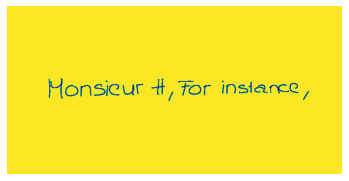

(-0.5, 863.5, 431.5, -0.5)

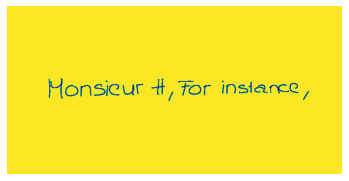

(-0.5, 863.5, 431.5, -0.5)

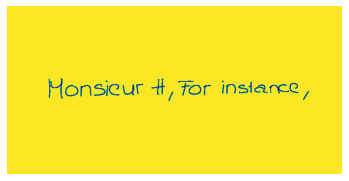

(-0.5, 863.5, 431.5, -0.5)

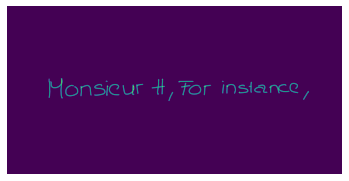

In [8]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

img = mpimg.imread('data/images/0/230.png')
print(img.shape)

for i in range(4):
    _=plt.imshow(img[:,:,i])
    plt.axis("off")
    plt.show()

In [9]:
for i in tqdm([23, 230, 231, 233]):
    img = mpimg.imread(f'data/images/0/{i}.png')
    print(img.shape)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 92.31it/s]

(432, 864, 4)
(432, 864, 4)
(432, 864, 4)
(432, 864, 4)


In [10]:
# %load_ext tensorboard
# %tensorboard --logdir logs/

In [11]:
from einops import rearrange

class LinearVAE(nn.Module):
    def __init__(self, width, height, channels, enc_features):
        super(LinearVAE, self).__init__()
        self.width = width
        self.height = height
        self.channels = channels
        self.input_dim = width * height * channels
        self.enc_features = enc_features
        
        self.enc1 = nn.Linear(in_features=self.input_dim, out_features=512)
        self.enc2 = nn.Linear(in_features=512, out_features=2*enc_features)
        
        self.dec1 = nn.Linear(in_features=enc_features, out_features=512)
        self.dec2 = nn.Linear(in_features=512, out_features=self.input_dim)
        
    def reparameterize(self, mu, log_var):
        std = torch.exp(0.5*log_var)
        eps = torch.randn_like(std)
        sample = mu + (eps * std)
        return sample
    
    def forward(self, x):
        x = rearrange(x, 'b c w h -> b (c w h)')
        enc1 = torch.relu(self.enc1(x))
        enc2 = torch.relu(self.enc2(enc1))
        
        mu, log_var = enc2.chunk(2, dim=-1)
        z = self.reparameterize(mu, log_var)
        
        dec1 = torch.relu(self.dec1(z))
        dec2 = torch.sigmoid(self.dec2(dec1))
        
        x_hat = rearrange(dec2, 'b (c w h) -> b c w h', c = self.channels, w = self.width, h = self.height)
        return x_hat, mu, log_var
    
    def loss_fnc(self, x_hat, x, mu, log_vars):
        return criterion(x_hat, x) + (- 0.5 * torch.sum(1 + log_vars - mu.pow(2) - log_vars.exp()))

    
    def sample(self, valid_input):
        print("Validation")
        _= plt.imshow(valid_input.squeeze().detach().cpu().numpy())
        _=plt.show()
        out, mu_v, log_vars_v = self.forward(valid_input)
        _= plt.imshow(out.squeeze().detach().cpu().numpy())
        _=plt.show()
        print(f"validation loss: {self.loss_fnc(out, valid_input, mu_v, log_vars_v)}")
        
        print("Random")
        with torch.no_grad():
            z = torch.randn(10, self.enc_features).to(device)
            dec1 = torch.relu(self.dec1(z))
            dec2 = torch.sigmoid(self.dec2(dec1))
            x_hat = rearrange(dec2, 'b (c w h) -> b c w h', c = self.channels, w = self.width, h = self.height)

            fig = plt.figure(figsize=(80, 8))
            for i in range(4):
                _=fig.add_subplot(1, 10, i+1)
                _=plt.imshow(x_hat[i, :, :, :].squeeze().detach().cpu().numpy())
            _=plt.show()
        
        
        

In [12]:
import torchvision
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torchvision import transforms



data_path = 'data/images/'
train_dataset = torchvision.datasets.ImageFolder(
    root=data_path,
    transform=transforms.Compose([
        torchvision.transforms.ToTensor(),
        transforms.Grayscale(num_output_channels=1)])
)

valid_dataset = torchvision.datasets.ImageFolder(
    root=data_path + "valid/",
    transform=transforms.Compose([
        torchvision.transforms.ToTensor(),
        transforms.Grayscale(num_output_channels=1)])
)

train_dl = DataLoader(
    train_dataset,
    batch_size=batch_size,
    num_workers=4,
    pin_memory=True,
    shuffle=True,
    drop_last=True
)
valid_dl = DataLoader(
    valid_dataset,
    batch_size=1,
    num_workers=1,
    shuffle=True,
    drop_last=True
)

def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(120, 60))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid((images[:nmax]), nrow=2).permute(1, 2, 0))

def show_batch(batch, nmax=64):
    for images, labels in train_dl:
        print(images.shape)
        show_images(images, nmax)
        break
        


In [13]:
import time

load_previous_state = True

model = LinearVAE(width=432, height=864, channels=1, enc_features=64)
if load_previous_state:
    checkpoint = torch.load(base_dir + model_name)
    model.load_state_dict(checkpoint['model_state_dict'])

model = model.to(device)

criterion = nn.BCELoss(reduction = 'sum')

print_every = 25
sample_every = print_every * 10
n_iter = 0
loss = 0
losses = []
start_time = time.time()

total_iters = n_epochs * len(train_dl)


<All keys matched successfully>

In [14]:
optimizer = torch.optim.Adam(model.parameters(), lr=lr)


n_iter : 0/46000, loss = 116677.000000000, time_since: 5.08
Validation


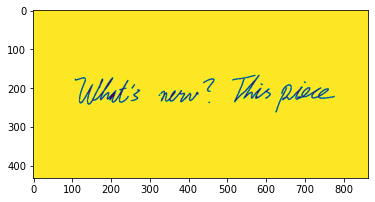

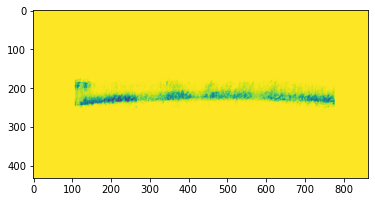

validation loss: 22244.080078125
Random


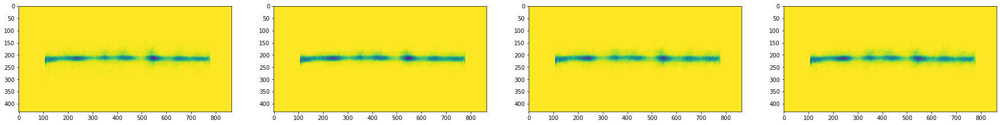

n_iter : 25/46000, loss = 3193761.990000000, time_since: 30.63
n_iter : 50/46000, loss = 3037355.360000000, time_since: 57.21
n_iter : 75/46000, loss = 3025355.720000000, time_since: 81.98
n_iter : 100/46000, loss = 3006463.400000000, time_since: 108.34
n_iter : 125/46000, loss = 3004726.760000000, time_since: 132.41
n_iter : 150/46000, loss = 3003082.100000000, time_since: 158.59
n_iter : 175/46000, loss = 2990840.380000000, time_since: 183.05
n_iter : 200/46000, loss = 2995974.770000000, time_since: 210.30
n_iter : 225/46000, loss = 2987160.380000000, time_since: 235.64
n_iter : 250/46000, loss = 2985528.180000000, time_since: 265.75


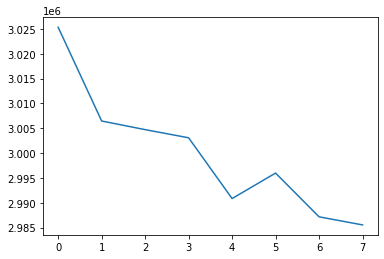

Validation


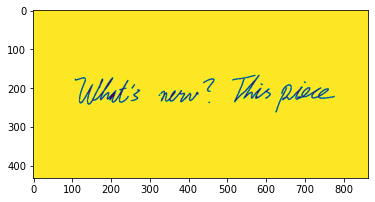

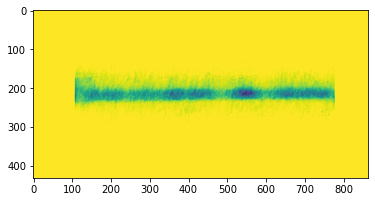

validation loss: 17091.103515625
Random


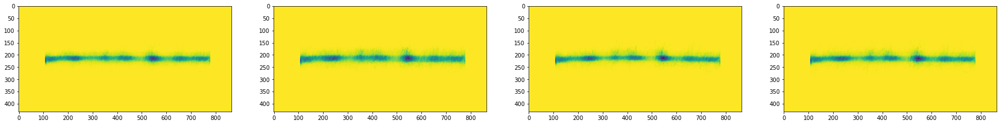

n_iter : 275/46000, loss = 2992420.560000000, time_since: 290.06
n_iter : 300/46000, loss = 2988013.790000000, time_since: 322.25
n_iter : 325/46000, loss = 2997114.640000000, time_since: 348.38
n_iter : 350/46000, loss = 2976994.420000000, time_since: 372.96
n_iter : 375/46000, loss = 2996950.900000000, time_since: 398.74
n_iter : 400/46000, loss = 2981446.670000000, time_since: 423.78
n_iter : 425/46000, loss = 2996636.690000000, time_since: 449.13
n_iter : 450/46000, loss = 2972591.660000000, time_since: 473.41
n_iter : 475/46000, loss = 2970716.750000000, time_since: 499.33
n_iter : 500/46000, loss = 2982643.170000000, time_since: 523.90


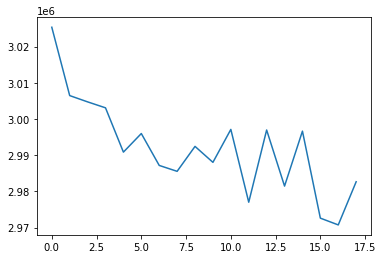

Validation


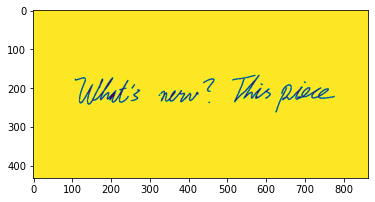

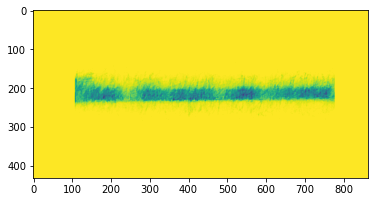

validation loss: 17097.314453125
Random


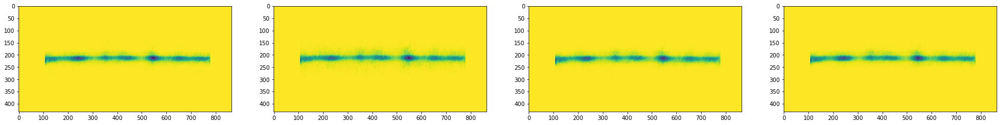

n_iter : 525/46000, loss = 2977695.280000000, time_since: 551.81
n_iter : 550/46000, loss = 2989405.990000000, time_since: 576.14
n_iter : 575/46000, loss = 2971025.900000000, time_since: 605.83
n_iter : 600/46000, loss = 2983692.270000000, time_since: 632.04
n_iter : 625/46000, loss = 2976323.890000000, time_since: 657.22
n_iter : 650/46000, loss = 2968473.430000000, time_since: 683.47
n_iter : 675/46000, loss = 2958021.830000000, time_since: 708.63
n_iter : 700/46000, loss = 2958305.240000000, time_since: 735.30
n_iter : 725/46000, loss = 2961722.010000000, time_since: 759.89
n_iter : 750/46000, loss = 2955639.230000000, time_since: 786.00


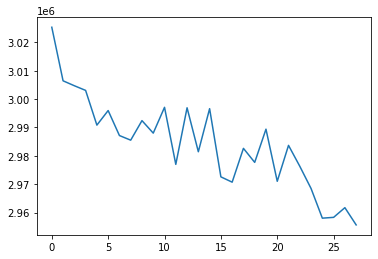

Validation


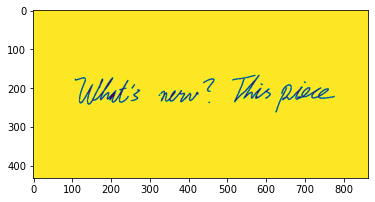

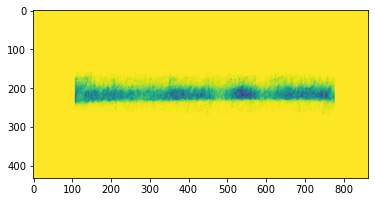

validation loss: 16744.02734375
Random


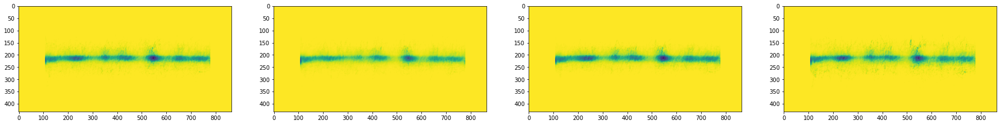

n_iter : 775/46000, loss = 2958419.530000000, time_since: 811.96
n_iter : 800/46000, loss = 2944038.640000000, time_since: 838.89
n_iter : 825/46000, loss = 2958627.250000000, time_since: 862.72
n_iter : 850/46000, loss = 2953241.220000000, time_since: 892.36
n_iter : 875/46000, loss = 2948985.800000000, time_since: 918.49
n_iter : 900/46000, loss = 2955173.470000000, time_since: 943.20
n_iter : 925/46000, loss = 2948978.260000000, time_since: 970.60
n_iter : 950/46000, loss = 2946083.910000000, time_since: 995.02
n_iter : 975/46000, loss = 2955424.820000000, time_since: 1021.42
n_iter : 1000/46000, loss = 2945207.190000000, time_since: 1046.78


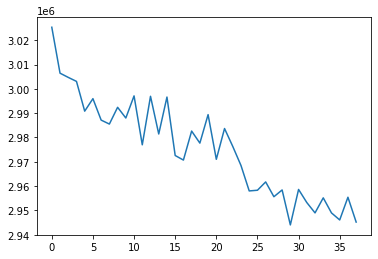

Validation


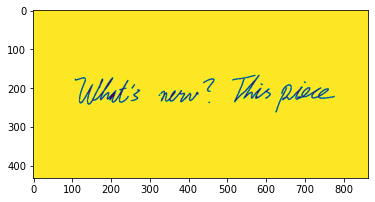

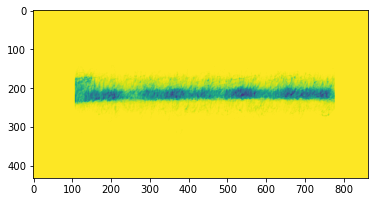

validation loss: 16900.431640625
Random


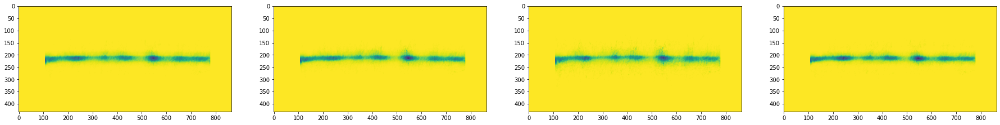

n_iter : 1025/46000, loss = 2936521.230000000, time_since: 1074.62
n_iter : 1050/46000, loss = 2953146.500000000, time_since: 1099.22
n_iter : 1075/46000, loss = 2948655.320000000, time_since: 1126.77
n_iter : 1100/46000, loss = 2953657.850000000, time_since: 1150.56
n_iter : 1125/46000, loss = 2947768.550000000, time_since: 1180.05
n_iter : 1150/46000, loss = 2940956.360000000, time_since: 1206.81
n_iter : 1175/46000, loss = 2952407.920000000, time_since: 1231.26
n_iter : 1200/46000, loss = 2936770.050000000, time_since: 1258.10
n_iter : 1225/46000, loss = 2943122.660000000, time_since: 1283.09
n_iter : 1250/46000, loss = 2939178.240000000, time_since: 1310.18


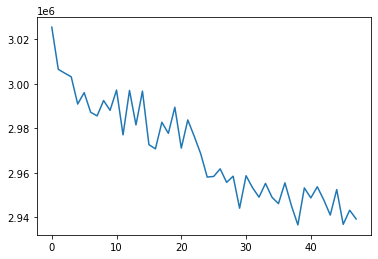

Validation


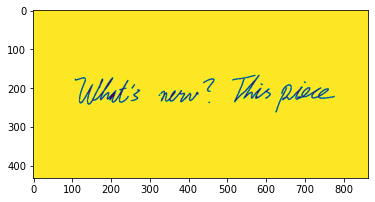

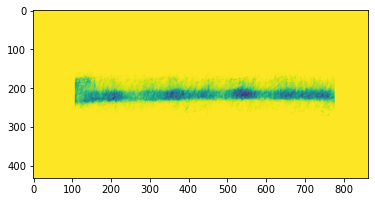

validation loss: 16758.890625
Random


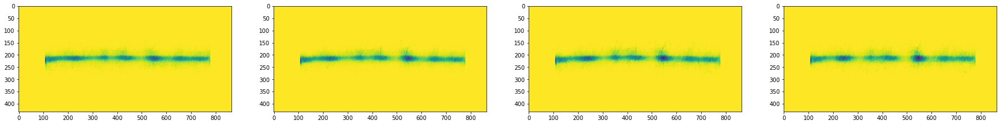

n_iter : 1275/46000, loss = 2951835.870000000, time_since: 1335.79
n_iter : 1300/46000, loss = 2944452.290000000, time_since: 1362.51
n_iter : 1325/46000, loss = 2935841.810000000, time_since: 1387.03
n_iter : 1350/46000, loss = 2931829.330000000, time_since: 1414.31
n_iter : 1375/46000, loss = 2958121.130000000, time_since: 1439.25
n_iter : 1400/46000, loss = 2955534.420000000, time_since: 1468.98
n_iter : 1425/46000, loss = 2944929.770000000, time_since: 1493.67
n_iter : 1450/46000, loss = 2937160.920000000, time_since: 1525.50
n_iter : 1475/46000, loss = 2950302.010000000, time_since: 1551.58
n_iter : 1500/46000, loss = 2937809.630000000, time_since: 1575.96


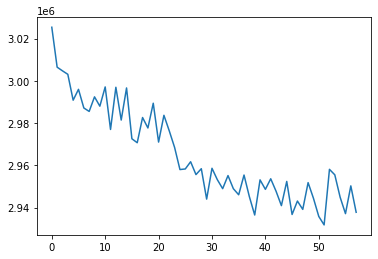

Validation


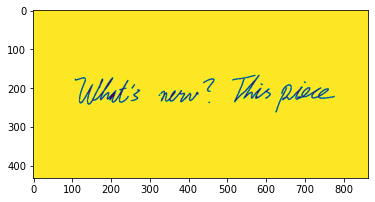

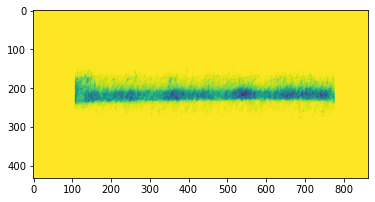

validation loss: 16862.9296875
Random


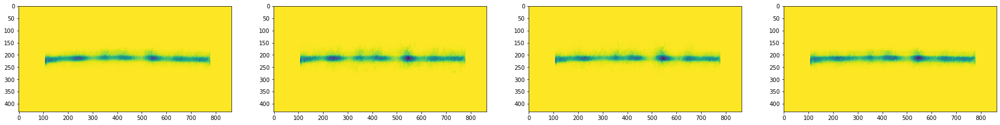

n_iter : 1525/46000, loss = 2938945.950000000, time_since: 1603.20
n_iter : 1550/46000, loss = 2945937.340000000, time_since: 1628.12
n_iter : 1575/46000, loss = 2942886.250000000, time_since: 1654.28
n_iter : 1600/46000, loss = 2952574.490000000, time_since: 1679.06
n_iter : 1625/46000, loss = 2927201.690000000, time_since: 1704.74
n_iter : 1650/46000, loss = 2952071.300000000, time_since: 1729.21
n_iter : 1675/46000, loss = 2939920.740000000, time_since: 1756.07
n_iter : 1700/46000, loss = 2942419.500000000, time_since: 1780.32
n_iter : 1725/46000, loss = 2926661.600000000, time_since: 1809.46
n_iter : 1750/46000, loss = 2954837.310000000, time_since: 1835.77


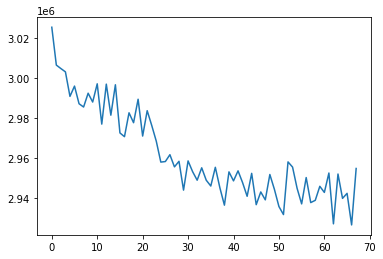

Validation


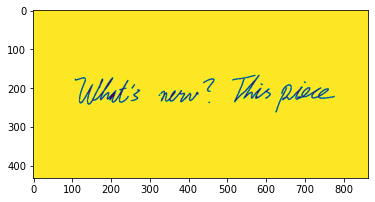

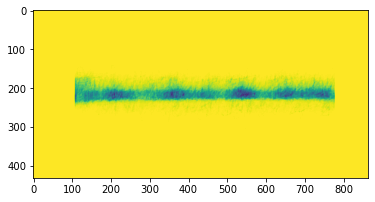

validation loss: 16972.203125
Random


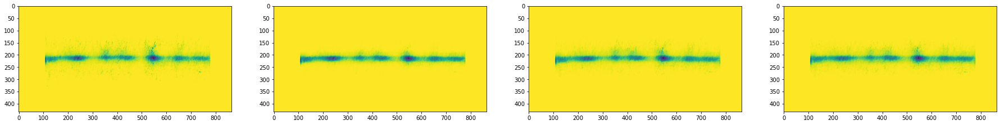

n_iter : 1775/46000, loss = 2939030.970000000, time_since: 1861.51
n_iter : 1800/46000, loss = 2939934.020000000, time_since: 1887.28
n_iter : 1825/46000, loss = 2941374.500000000, time_since: 1911.77
n_iter : 1850/46000, loss = 2940889.480000000, time_since: 1938.21
n_iter : 1875/46000, loss = 2938827.650000000, time_since: 1963.02
n_iter : 1900/46000, loss = 2948214.760000000, time_since: 1989.33
n_iter : 1925/46000, loss = 2934520.960000000, time_since: 2013.38
n_iter : 1950/46000, loss = 2934705.810000000, time_since: 2040.10
n_iter : 1975/46000, loss = 2943075.500000000, time_since: 2065.41
n_iter : 2000/46000, loss = 2944998.880000000, time_since: 2094.85


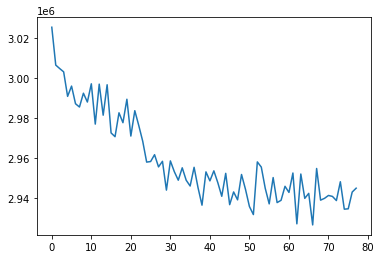

Validation


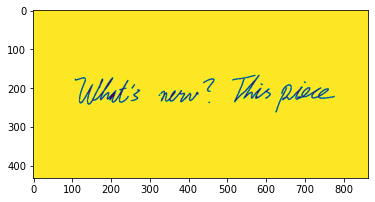

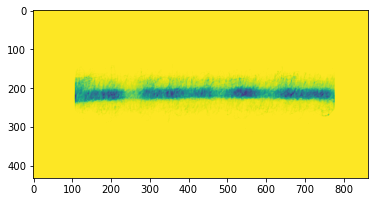

validation loss: 17285.52734375
Random


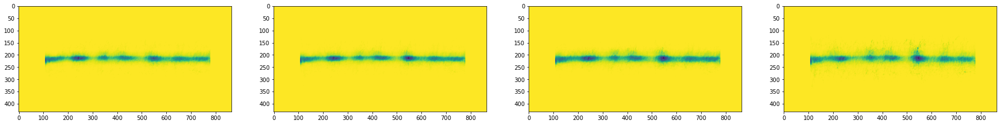

n_iter : 2025/46000, loss = 2933304.620000000, time_since: 2122.50
n_iter : 2050/46000, loss = 2934063.280000000, time_since: 2147.56
n_iter : 2075/46000, loss = 2937753.780000000, time_since: 2173.90
n_iter : 2100/46000, loss = 2944099.540000000, time_since: 2197.99
n_iter : 2125/46000, loss = 2950211.740000000, time_since: 2224.99
n_iter : 2150/46000, loss = 2935650.090000000, time_since: 2249.64
n_iter : 2175/46000, loss = 2922971.490000000, time_since: 2276.33
n_iter : 2200/46000, loss = 2949566.080000000, time_since: 2301.01
n_iter : 2225/46000, loss = 2939093.570000000, time_since: 2327.86
n_iter : 2250/46000, loss = 2934124.150000000, time_since: 2352.61


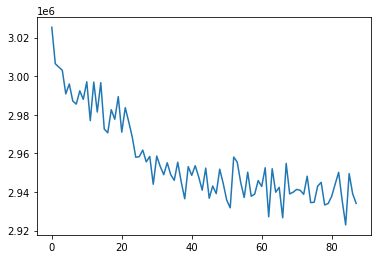

Validation


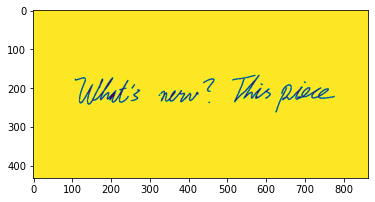

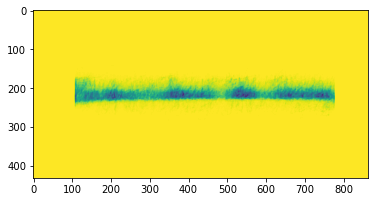

validation loss: 17010.06640625
Random


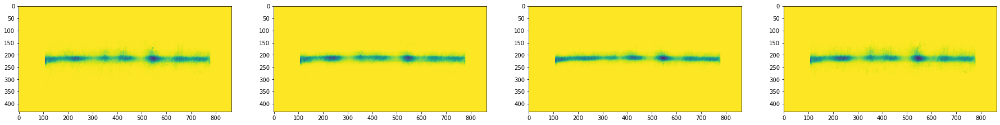

n_iter : 2275/46000, loss = 2937592.540000000, time_since: 2383.56
n_iter : 2300/46000, loss = 2935058.470000000, time_since: 2409.11
n_iter : 2325/46000, loss = 2934171.080000000, time_since: 2433.05
n_iter : 2350/46000, loss = 2943388.370000000, time_since: 2459.33
n_iter : 2375/46000, loss = 2932401.340000000, time_since: 2483.72
n_iter : 2400/46000, loss = 2936347.320000000, time_since: 2510.16
n_iter : 2425/46000, loss = 2932608.020000000, time_since: 2535.23
n_iter : 2450/46000, loss = 2941432.900000000, time_since: 2561.04
n_iter : 2475/46000, loss = 2941940.030000000, time_since: 2585.16
n_iter : 2500/46000, loss = 2928478.360000000, time_since: 2612.56


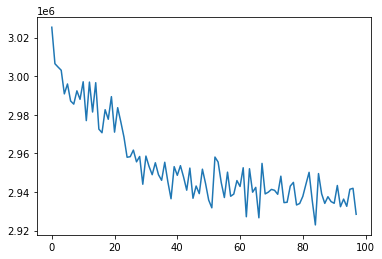

Validation


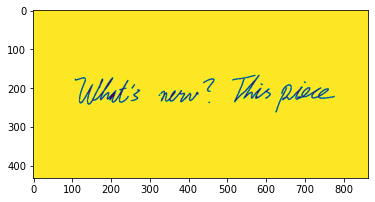

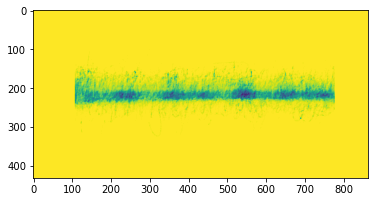

validation loss: 17196.4765625
Random


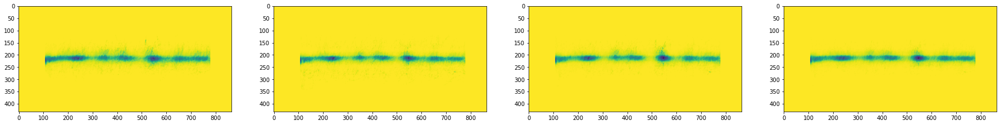

n_iter : 2525/46000, loss = 2942212.630000000, time_since: 2638.90
n_iter : 2550/46000, loss = 2936141.220000000, time_since: 2667.78
n_iter : 2575/46000, loss = 2938702.640000000, time_since: 2692.11
n_iter : 2600/46000, loss = 2925900.120000000, time_since: 2724.26
n_iter : 2625/46000, loss = 2944303.300000000, time_since: 2749.94
n_iter : 2650/46000, loss = 2937155.550000000, time_since: 2774.52
n_iter : 2675/46000, loss = 2931147.870000000, time_since: 2800.66
n_iter : 2700/46000, loss = 2941087.800000000, time_since: 2825.32
n_iter : 2725/46000, loss = 2936452.670000000, time_since: 2851.75
n_iter : 2750/46000, loss = 2934033.630000000, time_since: 2876.84


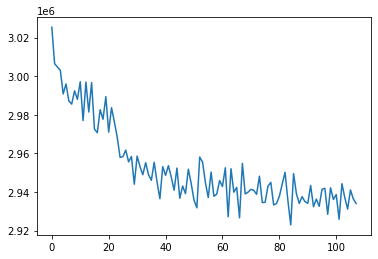

Validation


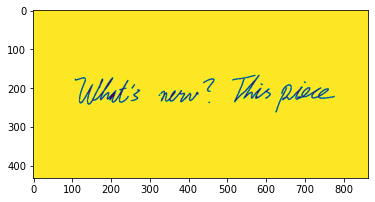

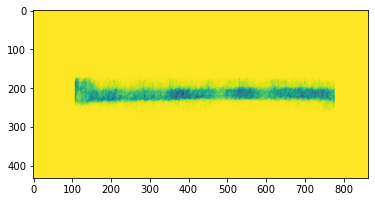

validation loss: 17575.466796875
Random


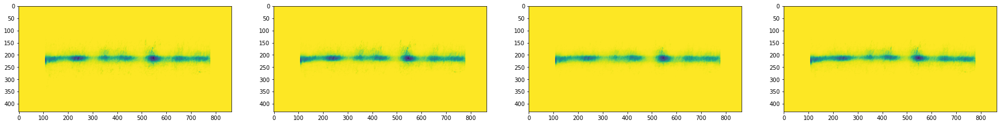

n_iter : 2775/46000, loss = 2941124.090000000, time_since: 2904.09
n_iter : 2800/46000, loss = 2937156.620000000, time_since: 2928.55
n_iter : 2825/46000, loss = 2932635.390000000, time_since: 2955.63
n_iter : 2850/46000, loss = 2940104.170000000, time_since: 2979.68
n_iter : 2875/46000, loss = 2939392.390000000, time_since: 3009.09
n_iter : 2900/46000, loss = 2928709.660000000, time_since: 3035.77
n_iter : 2925/46000, loss = 2940423.190000000, time_since: 3061.23
n_iter : 2950/46000, loss = 2933188.190000000, time_since: 3087.49
n_iter : 2975/46000, loss = 2938044.220000000, time_since: 3111.90
n_iter : 3000/46000, loss = 2932950.370000000, time_since: 3137.62


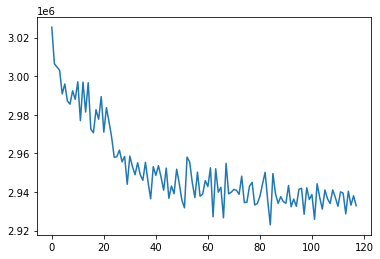

Validation


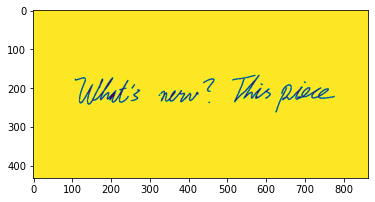

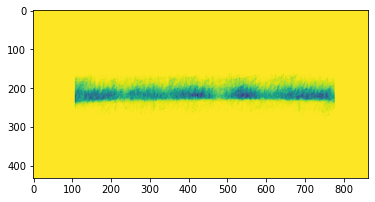

validation loss: 17087.755859375
Random


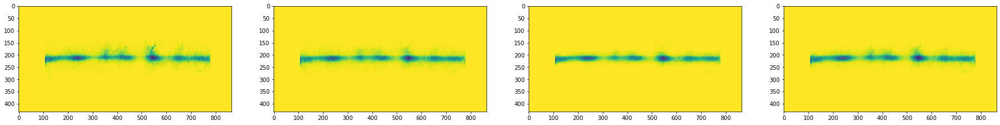

n_iter : 3025/46000, loss = 2933157.960000000, time_since: 3163.42
n_iter : 3050/46000, loss = 2937755.590000000, time_since: 3190.14
n_iter : 3075/46000, loss = 2924468.310000000, time_since: 3215.34
n_iter : 3100/46000, loss = 2936200.320000000, time_since: 3242.39
n_iter : 3125/46000, loss = 2947905.670000000, time_since: 3266.97
n_iter : 3150/46000, loss = 2933910.420000000, time_since: 3296.24
n_iter : 3175/46000, loss = 2935308.830000000, time_since: 3322.60
n_iter : 3200/46000, loss = 2936477.170000000, time_since: 3346.41
n_iter : 3225/46000, loss = 2936233.470000000, time_since: 3373.04
n_iter : 3250/46000, loss = 2939951.440000000, time_since: 3397.91


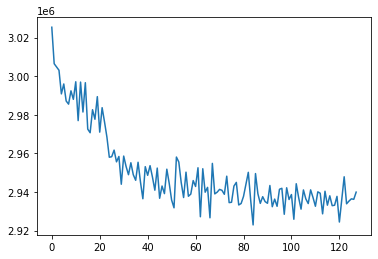

Validation


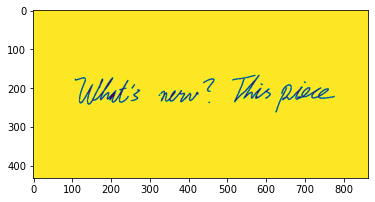

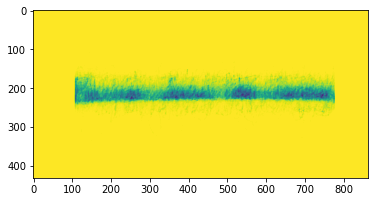

validation loss: 16920.6796875
Random


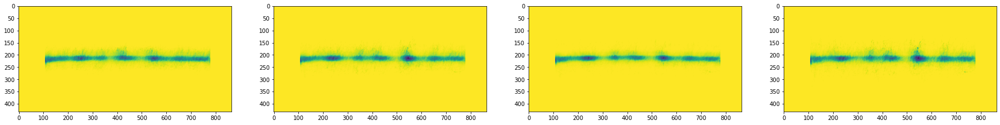

n_iter : 3275/46000, loss = 2939773.100000000, time_since: 3425.14
n_iter : 3300/46000, loss = 2939552.560000000, time_since: 3450.18
n_iter : 3325/46000, loss = 2934500.410000000, time_since: 3476.98
n_iter : 3350/46000, loss = 2937614.700000000, time_since: 3501.09
n_iter : 3375/46000, loss = 2928237.950000000, time_since: 3528.35
n_iter : 3400/46000, loss = 2933962.620000000, time_since: 3552.45
n_iter : 3425/46000, loss = 2944001.810000000, time_since: 3582.08
n_iter : 3450/46000, loss = 2926577.160000000, time_since: 3609.01
n_iter : 3475/46000, loss = 2933999.550000000, time_since: 3633.90
n_iter : 3500/46000, loss = 2935030.690000000, time_since: 3660.66


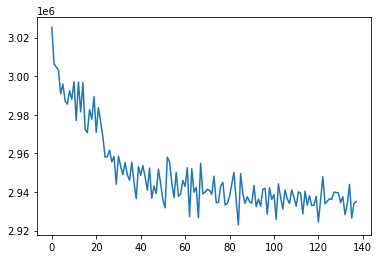

Validation


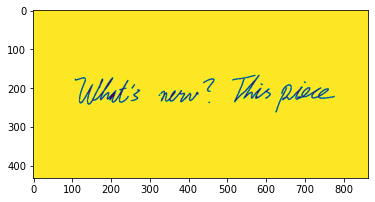

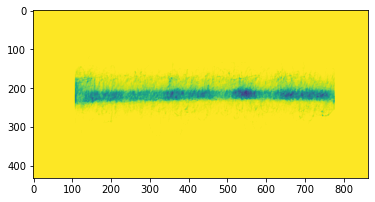

validation loss: 16759.955078125
Random


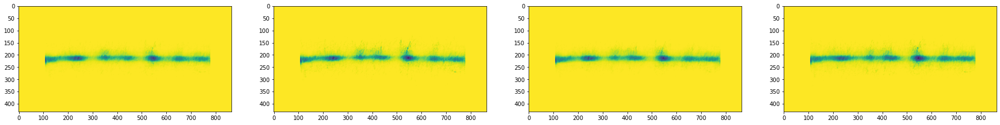

n_iter : 3525/46000, loss = 2921482.920000000, time_since: 3686.44
n_iter : 3550/46000, loss = 2941792.620000000, time_since: 3712.69
n_iter : 3575/46000, loss = 2928796.310000000, time_since: 3737.18
n_iter : 3600/46000, loss = 2932722.740000000, time_since: 3763.21
n_iter : 3625/46000, loss = 2934749.390000000, time_since: 3787.75
n_iter : 3650/46000, loss = 2929017.160000000, time_since: 3814.79
n_iter : 3675/46000, loss = 2934172.030000000, time_since: 3839.44
n_iter : 3700/46000, loss = 2924508.630000000, time_since: 3868.41
n_iter : 3725/46000, loss = 2938376.680000000, time_since: 3892.63
n_iter : 3750/46000, loss = 2926036.000000000, time_since: 3925.20


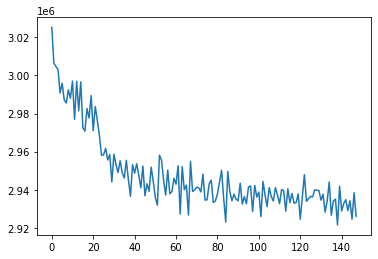

Validation


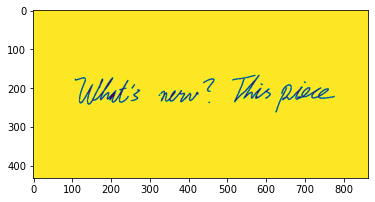

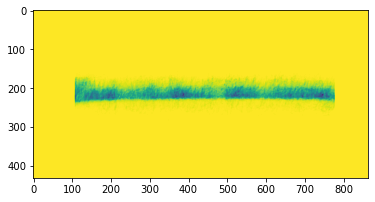

validation loss: 17585.98828125
Random


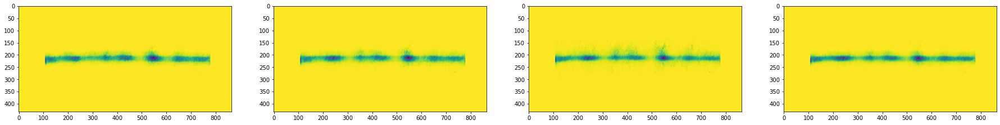

n_iter : 3775/46000, loss = 2945666.400000000, time_since: 3952.49
n_iter : 3800/46000, loss = 2920491.600000000, time_since: 3977.26
n_iter : 3825/46000, loss = 2937950.270000000, time_since: 4003.61
n_iter : 3850/46000, loss = 2939926.700000000, time_since: 4029.12
n_iter : 3875/46000, loss = 2923062.450000000, time_since: 4055.42
n_iter : 3900/46000, loss = 2932592.700000000, time_since: 4080.50
n_iter : 3925/46000, loss = 2931060.720000000, time_since: 4106.61
n_iter : 3950/46000, loss = 2944866.810000000, time_since: 4130.71
n_iter : 3975/46000, loss = 2927473.820000000, time_since: 4157.12
n_iter : 4000/46000, loss = 2930973.300000000, time_since: 4181.68


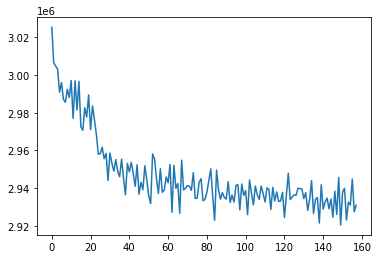

Validation


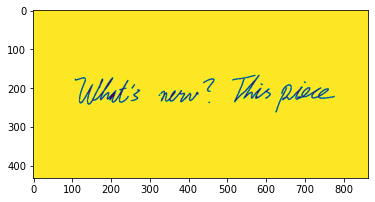

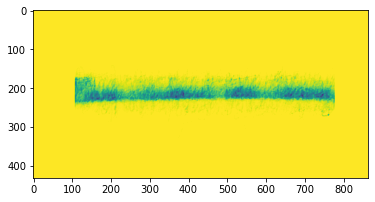

validation loss: 16823.46484375
Random


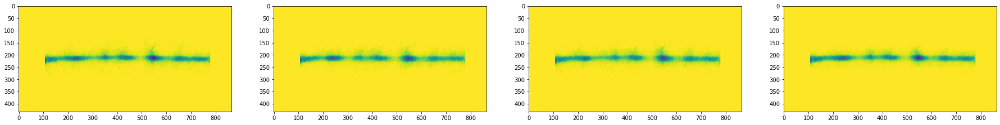

n_iter : 4025/46000, loss = 2925188.500000000, time_since: 4212.36
n_iter : 4050/46000, loss = 2932173.100000000, time_since: 4238.25
n_iter : 4075/46000, loss = 2940369.490000000, time_since: 4263.27
n_iter : 4100/46000, loss = 2940691.190000000, time_since: 4289.16
n_iter : 4125/46000, loss = 2930213.410000000, time_since: 4314.01
n_iter : 4150/46000, loss = 2937064.480000000, time_since: 4340.42
n_iter : 4175/46000, loss = 2923932.810000000, time_since: 4364.93
n_iter : 4200/46000, loss = 2934312.330000000, time_since: 4391.44
n_iter : 4225/46000, loss = 2926322.970000000, time_since: 4416.06
n_iter : 4250/46000, loss = 2924182.100000000, time_since: 4442.99


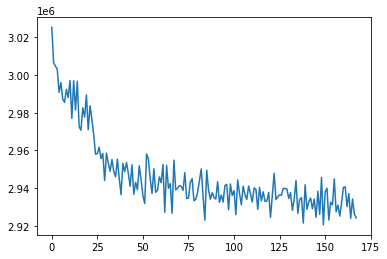

Validation


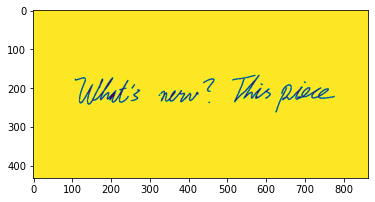

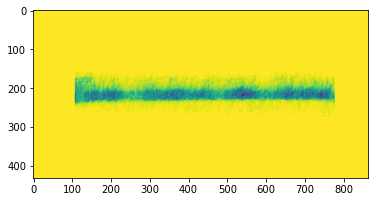

validation loss: 16792.650390625
Random


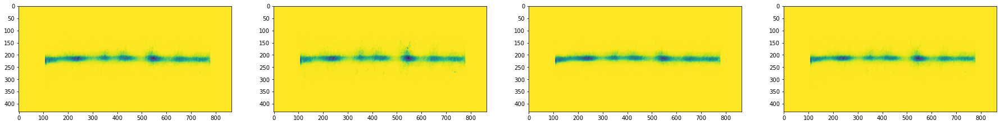

n_iter : 4275/46000, loss = 2927444.240000000, time_since: 4468.72
n_iter : 4300/46000, loss = 2938026.970000000, time_since: 4498.15
n_iter : 4325/46000, loss = 2919443.550000000, time_since: 4524.12
n_iter : 4350/46000, loss = 2928786.720000000, time_since: 4547.87
n_iter : 4375/46000, loss = 2930613.320000000, time_since: 4574.17
n_iter : 4400/46000, loss = 2925631.930000000, time_since: 4598.50
n_iter : 4425/46000, loss = 2933139.550000000, time_since: 4625.20
n_iter : 4450/46000, loss = 2928367.190000000, time_since: 4649.56
n_iter : 4475/46000, loss = 2922173.310000000, time_since: 4675.94
n_iter : 4500/46000, loss = 2934384.080000000, time_since: 4701.32


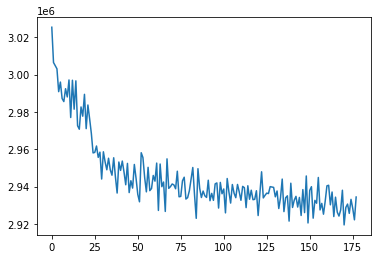

Validation


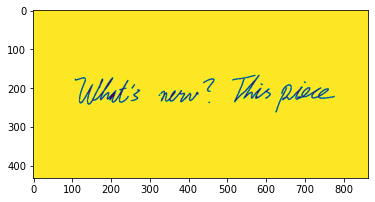

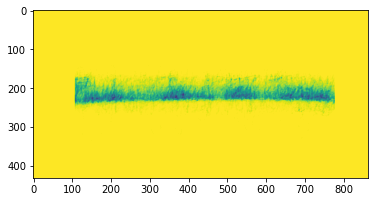

validation loss: 16812.208984375
Random


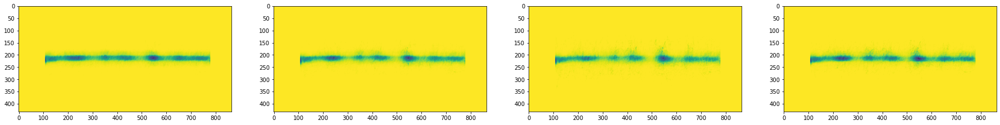

n_iter : 4525/46000, loss = 2937622.670000000, time_since: 4729.01
n_iter : 4550/46000, loss = 2927514.110000000, time_since: 4753.81
n_iter : 4575/46000, loss = 2924522.500000000, time_since: 4783.43
n_iter : 4600/46000, loss = 2932382.700000000, time_since: 4810.21
n_iter : 4625/46000, loss = 2935004.090000000, time_since: 4835.28
n_iter : 4650/46000, loss = 2925450.160000000, time_since: 4861.99
n_iter : 4675/46000, loss = 2930756.630000000, time_since: 4887.14
n_iter : 4700/46000, loss = 2932097.000000000, time_since: 4914.00
n_iter : 4725/46000, loss = 2927654.860000000, time_since: 4938.67
n_iter : 4750/46000, loss = 2929468.630000000, time_since: 4965.49


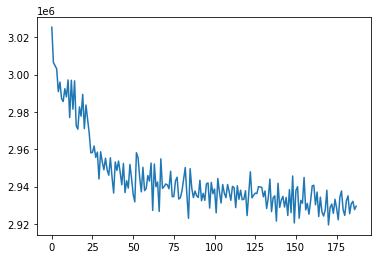

Validation


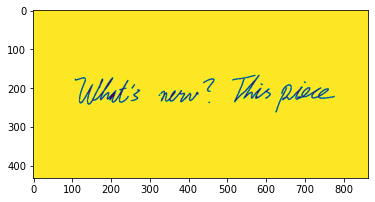

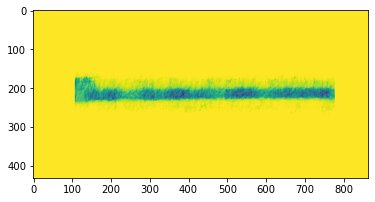

validation loss: 17314.716796875
Random


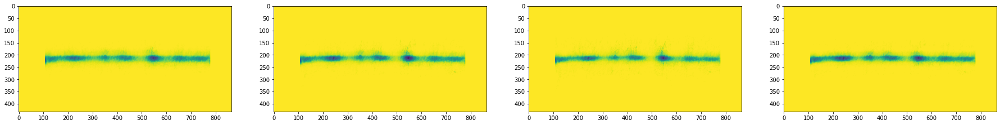

n_iter : 4775/46000, loss = 2932723.260000000, time_since: 4991.32
n_iter : 4800/46000, loss = 2933584.460000000, time_since: 5019.02
n_iter : 4825/46000, loss = 2929160.500000000, time_since: 5043.42
n_iter : 4850/46000, loss = 2922676.040000000, time_since: 5073.41
n_iter : 4875/46000, loss = 2939422.850000000, time_since: 5097.46
n_iter : 4900/46000, loss = 2931594.290000000, time_since: 5129.54
n_iter : 4925/46000, loss = 2933048.300000000, time_since: 5155.45
n_iter : 4950/46000, loss = 2931425.530000000, time_since: 5179.63
n_iter : 4975/46000, loss = 2925598.380000000, time_since: 5205.00
n_iter : 5000/46000, loss = 2931849.620000000, time_since: 5229.97


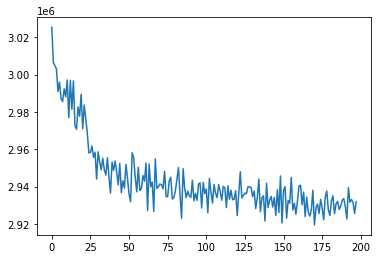

Validation


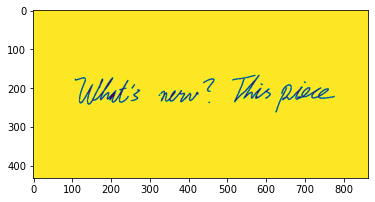

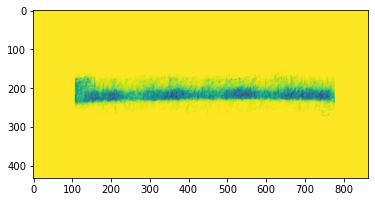

validation loss: 16737.890625
Random


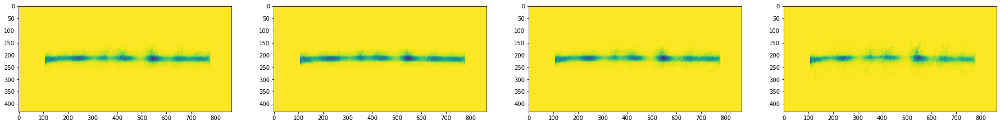

n_iter : 5025/46000, loss = 2915898.910000000, time_since: 5257.46
n_iter : 5050/46000, loss = 2947455.080000000, time_since: 5281.99
n_iter : 5075/46000, loss = 2925372.760000000, time_since: 5308.28
n_iter : 5100/46000, loss = 2930762.190000000, time_since: 5333.63
n_iter : 5125/46000, loss = 2927426.720000000, time_since: 5360.35
n_iter : 5150/46000, loss = 2927323.920000000, time_since: 5384.59
n_iter : 5175/46000, loss = 2923118.350000000, time_since: 5414.10
n_iter : 5200/46000, loss = 2929308.760000000, time_since: 5440.59
n_iter : 5225/46000, loss = 2930324.210000000, time_since: 5464.88
n_iter : 5250/46000, loss = 2927426.410000000, time_since: 5490.86


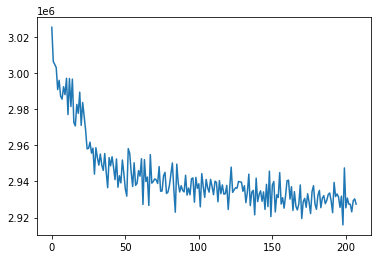

Validation


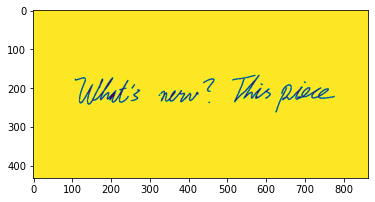

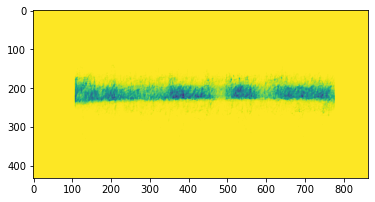

validation loss: 17012.953125
Random


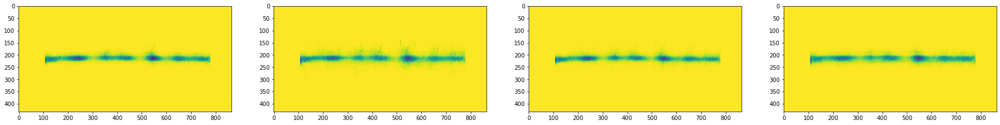

n_iter : 5275/46000, loss = 2925603.310000000, time_since: 5517.19
n_iter : 5300/46000, loss = 2923384.580000000, time_since: 5543.35
n_iter : 5325/46000, loss = 2927873.360000000, time_since: 5568.19
n_iter : 5350/46000, loss = 2929128.060000000, time_since: 5594.25
n_iter : 5375/46000, loss = 2924842.440000000, time_since: 5619.10
n_iter : 5400/46000, loss = 2928295.250000000, time_since: 5646.63
n_iter : 5425/46000, loss = 2925287.830000000, time_since: 5671.36
n_iter : 5450/46000, loss = 2937638.270000000, time_since: 5701.58
n_iter : 5475/46000, loss = 2918641.430000000, time_since: 5729.15
n_iter : 5500/46000, loss = 2932028.520000000, time_since: 5753.38


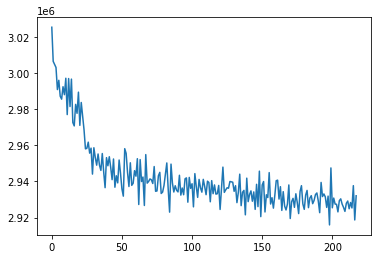

Validation


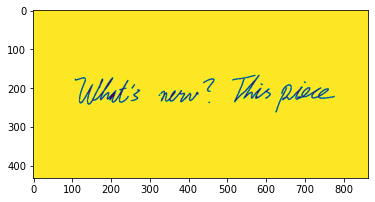

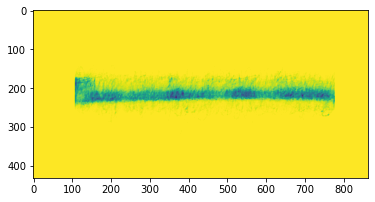

validation loss: 16964.05859375
Random


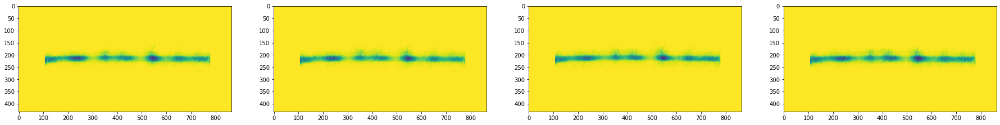

n_iter : 5525/46000, loss = 2924554.200000000, time_since: 5781.39
n_iter : 5550/46000, loss = 2922098.640000000, time_since: 5806.51
n_iter : 5575/46000, loss = 2927499.550000000, time_since: 5833.20
n_iter : 5600/46000, loss = 2932901.230000000, time_since: 5857.67
n_iter : 5625/46000, loss = 2934109.040000000, time_since: 5883.49
n_iter : 5650/46000, loss = 2933697.100000000, time_since: 5907.43
n_iter : 5675/46000, loss = 2924269.020000000, time_since: 5934.00
n_iter : 5700/46000, loss = 2921185.050000000, time_since: 5958.14
n_iter : 5725/46000, loss = 2929453.160000000, time_since: 5987.85
n_iter : 5750/46000, loss = 2925321.830000000, time_since: 6014.69


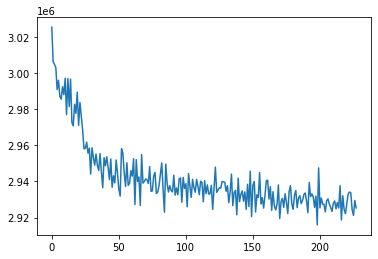

Validation


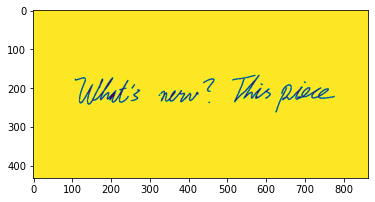

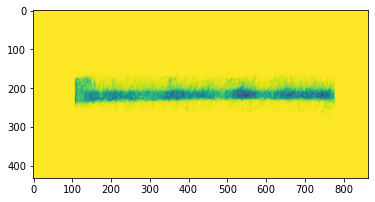

validation loss: 16656.671875
Random


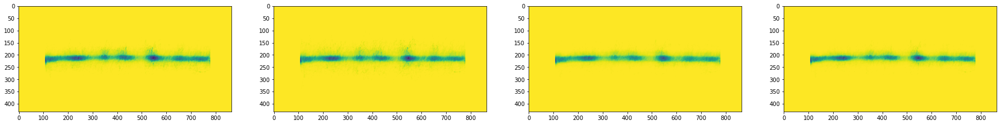

n_iter : 5775/46000, loss = 2912485.250000000, time_since: 6040.17
n_iter : 5800/46000, loss = 2933994.250000000, time_since: 6066.89
n_iter : 5825/46000, loss = 2930782.060000000, time_since: 6092.69
n_iter : 5850/46000, loss = 2926610.110000000, time_since: 6119.51
n_iter : 5875/46000, loss = 2920232.240000000, time_since: 6144.80
n_iter : 5900/46000, loss = 2938936.070000000, time_since: 6172.14
n_iter : 5925/46000, loss = 2925737.060000000, time_since: 6196.41
n_iter : 5950/46000, loss = 2918362.140000000, time_since: 6223.14
n_iter : 5975/46000, loss = 2937575.370000000, time_since: 6247.21
n_iter : 6000/46000, loss = 2918021.610000000, time_since: 6276.50


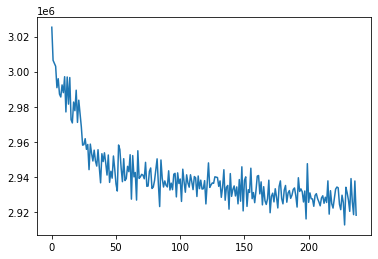

Validation


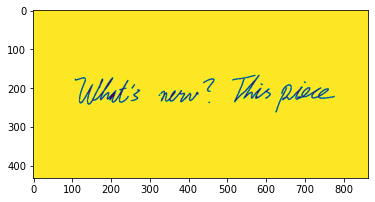

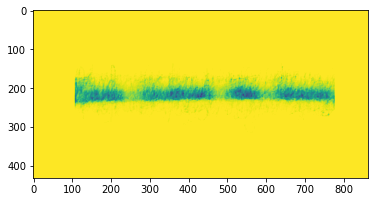

validation loss: 16849.8359375
Random


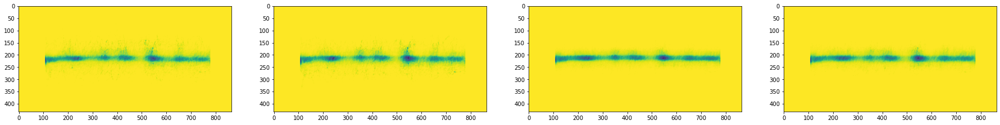

n_iter : 6025/46000, loss = 2933581.400000000, time_since: 6301.72
n_iter : 6050/46000, loss = 2913444.800000000, time_since: 6334.04
n_iter : 6075/46000, loss = 2932433.020000000, time_since: 6359.38
n_iter : 6100/46000, loss = 2924689.940000000, time_since: 6383.73
n_iter : 6125/46000, loss = 2925473.920000000, time_since: 6410.25
n_iter : 6150/46000, loss = 2923945.100000000, time_since: 6435.02
n_iter : 6175/46000, loss = 2931234.810000000, time_since: 6460.91
n_iter : 6200/46000, loss = 2924234.750000000, time_since: 6485.66
n_iter : 6225/46000, loss = 2921895.350000000, time_since: 6511.87
n_iter : 6250/46000, loss = 2925746.690000000, time_since: 6536.33


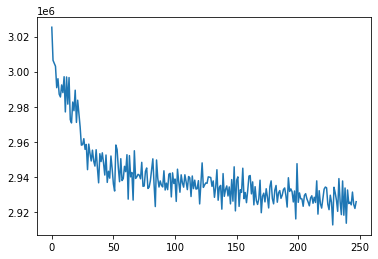

Validation


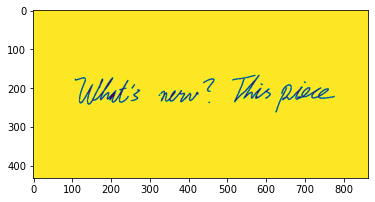

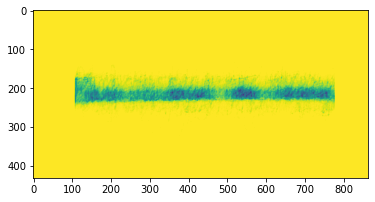

validation loss: 16668.1796875
Random


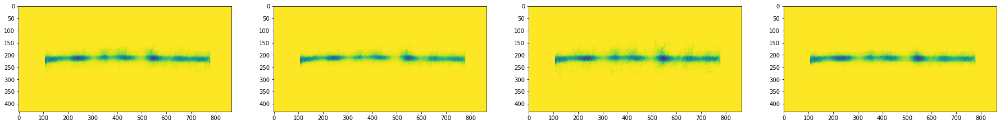

n_iter : 6275/46000, loss = 2926870.820000000, time_since: 6564.32
n_iter : 6300/46000, loss = 2934902.630000000, time_since: 6589.08
n_iter : 6325/46000, loss = 2921091.240000000, time_since: 6618.42
n_iter : 6350/46000, loss = 2929575.920000000, time_since: 6644.78
n_iter : 6375/46000, loss = 2918718.550000000, time_since: 6670.07
n_iter : 6400/46000, loss = 2933883.720000000, time_since: 6696.03
n_iter : 6425/46000, loss = 2924961.040000000, time_since: 6720.70
n_iter : 6450/46000, loss = 2928107.410000000, time_since: 6746.95
n_iter : 6475/46000, loss = 2914579.580000000, time_since: 6771.27
n_iter : 6500/46000, loss = 2937679.550000000, time_since: 6797.62


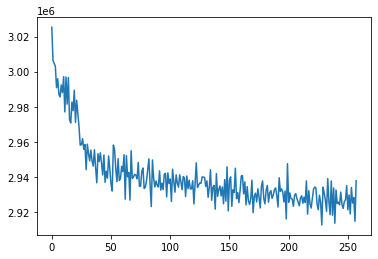

Validation


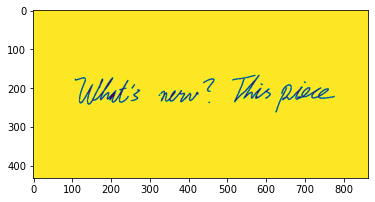

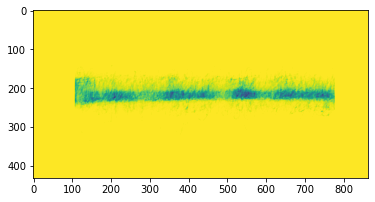

validation loss: 16712.322265625
Random


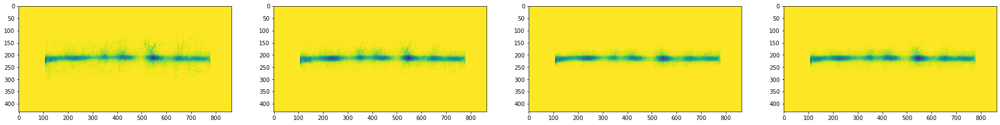

n_iter : 6525/46000, loss = 2929230.970000000, time_since: 6823.31
n_iter : 6550/46000, loss = 2919409.960000000, time_since: 6850.09
n_iter : 6575/46000, loss = 2926117.090000000, time_since: 6874.76
n_iter : 6600/46000, loss = 2919583.430000000, time_since: 6904.26
n_iter : 6625/46000, loss = 2930225.460000000, time_since: 6930.88
n_iter : 6650/46000, loss = 2926749.210000000, time_since: 6955.28
n_iter : 6675/46000, loss = 2919805.960000000, time_since: 6981.75
n_iter : 6700/46000, loss = 2926299.500000000, time_since: 7006.44
n_iter : 6725/46000, loss = 2936090.560000000, time_since: 7032.46
n_iter : 6750/46000, loss = 2915926.280000000, time_since: 7057.00


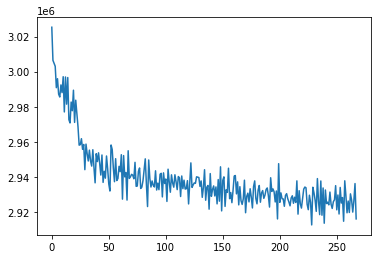

Validation


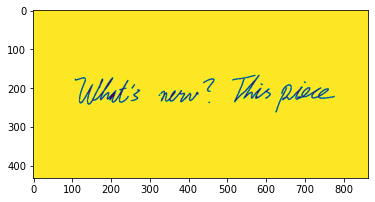

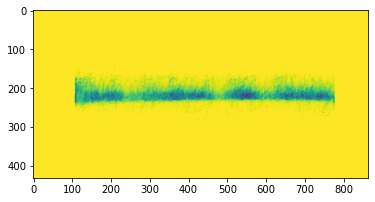

validation loss: 16782.578125
Random


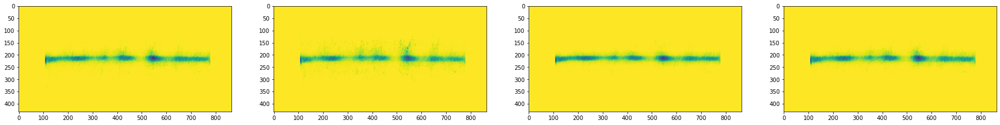

n_iter : 6775/46000, loss = 2918859.070000000, time_since: 7085.02
n_iter : 6800/46000, loss = 2935934.240000000, time_since: 7109.43
n_iter : 6825/46000, loss = 2920051.460000000, time_since: 7136.40
n_iter : 6850/46000, loss = 2921745.710000000, time_since: 7160.49
n_iter : 6875/46000, loss = 2916747.270000000, time_since: 7189.53
n_iter : 6900/46000, loss = 2927283.570000000, time_since: 7216.05
n_iter : 6925/46000, loss = 2910210.590000000, time_since: 7240.37
n_iter : 6950/46000, loss = 2939823.880000000, time_since: 7267.67
n_iter : 6975/46000, loss = 2909702.030000000, time_since: 7292.85
n_iter : 7000/46000, loss = 2931212.200000000, time_since: 7319.04


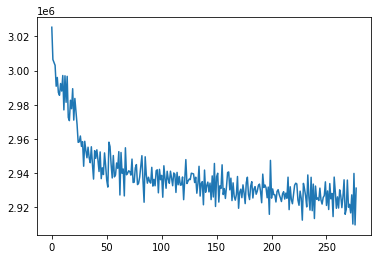

Validation


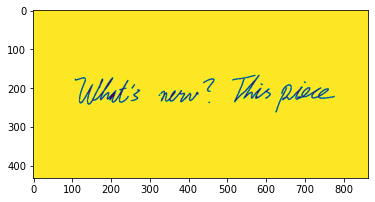

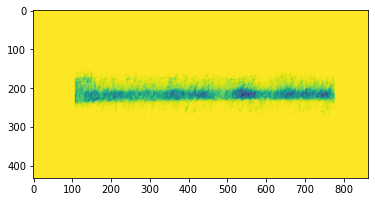

validation loss: 16754.626953125
Random


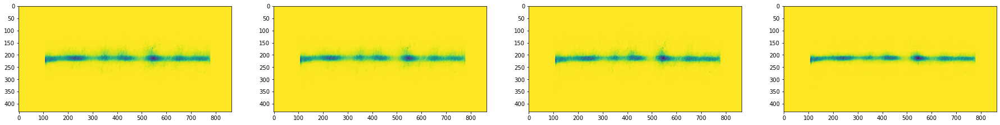

n_iter : 7025/46000, loss = 2918375.400000000, time_since: 7345.40
n_iter : 7050/46000, loss = 2917046.390000000, time_since: 7372.12
n_iter : 7075/46000, loss = 2921762.440000000, time_since: 7396.85
n_iter : 7100/46000, loss = 2921716.070000000, time_since: 7423.69
n_iter : 7125/46000, loss = 2931902.580000000, time_since: 7448.91
n_iter : 7150/46000, loss = 2908663.360000000, time_since: 7477.71
n_iter : 7175/46000, loss = 2936219.900000000, time_since: 7501.86
n_iter : 7200/46000, loss = 2921478.620000000, time_since: 7534.54
n_iter : 7225/46000, loss = 2920251.470000000, time_since: 7560.31
n_iter : 7250/46000, loss = 2918126.520000000, time_since: 7584.67


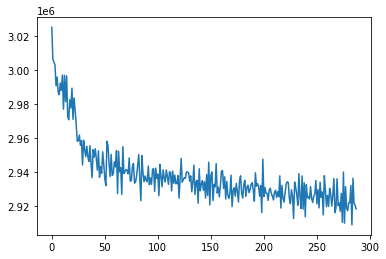

Validation


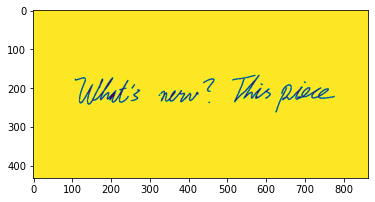

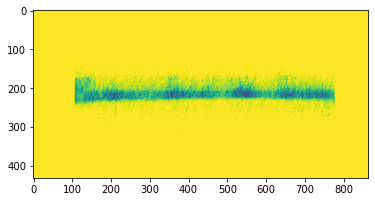

validation loss: 16885.390625
Random


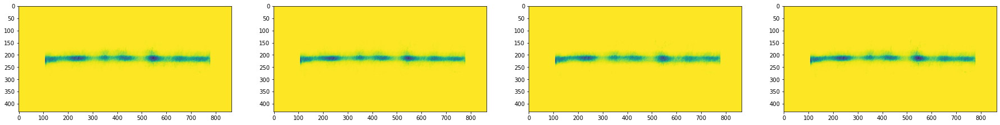

n_iter : 7275/46000, loss = 2928246.830000000, time_since: 7612.03
n_iter : 7300/46000, loss = 2919864.850000000, time_since: 7635.92
n_iter : 7325/46000, loss = 2929067.520000000, time_since: 7662.10
n_iter : 7350/46000, loss = 2920730.810000000, time_since: 7686.76
n_iter : 7375/46000, loss = 2919622.260000000, time_since: 7712.96
n_iter : 7400/46000, loss = 2921726.260000000, time_since: 7737.03
n_iter : 7425/46000, loss = 2930667.400000000, time_since: 7764.57
n_iter : 7450/46000, loss = 2920540.490000000, time_since: 7788.87
n_iter : 7475/46000, loss = 2921737.920000000, time_since: 7818.29
n_iter : 7500/46000, loss = 2922711.560000000, time_since: 7844.56


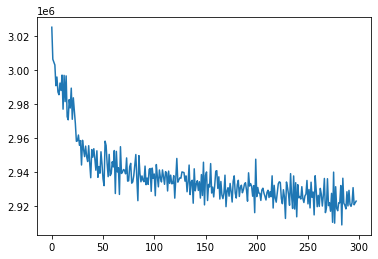

Validation


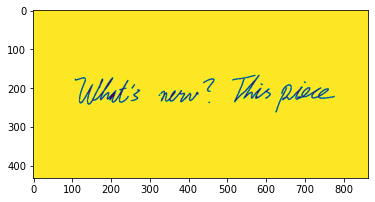

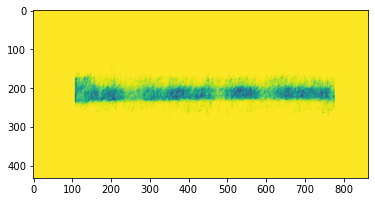

validation loss: 16955.318359375
Random


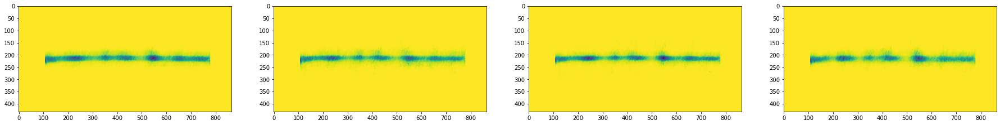

n_iter : 7525/46000, loss = 2932367.580000000, time_since: 7870.05
n_iter : 7550/46000, loss = 2904394.370000000, time_since: 7896.25
n_iter : 7575/46000, loss = 2920171.320000000, time_since: 7921.67
n_iter : 7600/46000, loss = 2930941.540000000, time_since: 7947.49
n_iter : 7625/46000, loss = 2906543.940000000, time_since: 7971.83
n_iter : 7650/46000, loss = 2921235.800000000, time_since: 7998.67
n_iter : 7675/46000, loss = 2930260.450000000, time_since: 8022.91
n_iter : 7700/46000, loss = 2930044.370000000, time_since: 8049.90
n_iter : 7725/46000, loss = 2934512.810000000, time_since: 8074.26
n_iter : 7750/46000, loss = 2921174.050000000, time_since: 8103.57


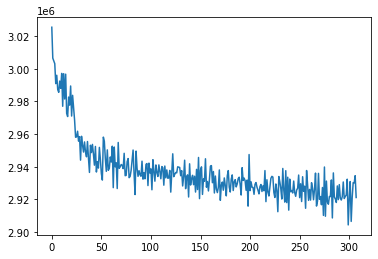

Validation


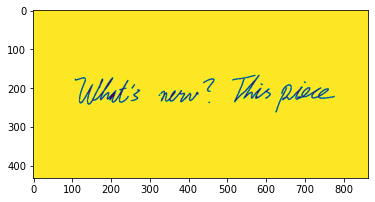

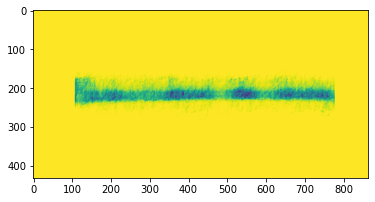

validation loss: 16747.54296875
Random


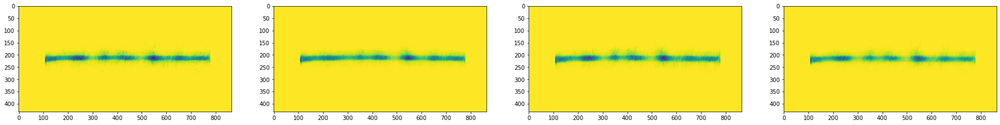

n_iter : 7775/46000, loss = 2919695.970000000, time_since: 8131.47
n_iter : 7800/46000, loss = 2917746.580000000, time_since: 8155.89
n_iter : 7825/46000, loss = 2924272.160000000, time_since: 8182.13
n_iter : 7850/46000, loss = 2920751.870000000, time_since: 8207.20
n_iter : 7875/46000, loss = 2921229.200000000, time_since: 8233.87
n_iter : 7900/46000, loss = 2914969.470000000, time_since: 8258.18
n_iter : 7925/46000, loss = 2925723.710000000, time_since: 8284.24
n_iter : 7950/46000, loss = 2935021.160000000, time_since: 8308.69
n_iter : 7975/46000, loss = 2918270.850000000, time_since: 8335.67
n_iter : 8000/46000, loss = 2915190.780000000, time_since: 8360.34


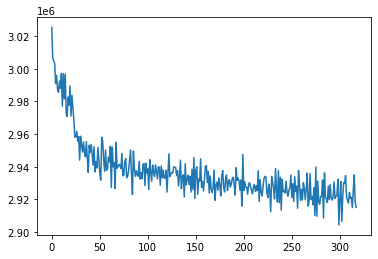

Validation


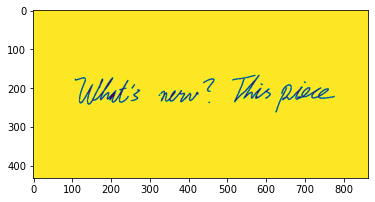

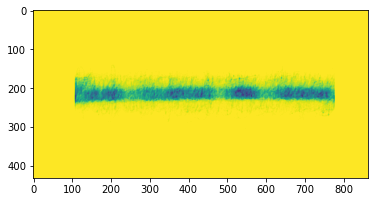

validation loss: 16894.677734375
Random


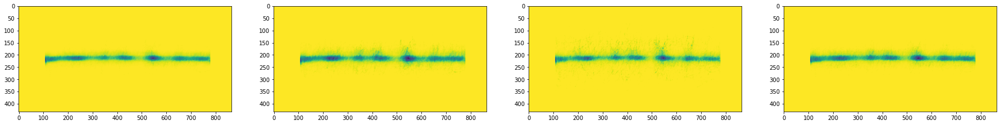

n_iter : 8025/46000, loss = 2911457.680000000, time_since: 8390.83
n_iter : 8050/46000, loss = 2927102.390000000, time_since: 8416.75
n_iter : 8075/46000, loss = 2925586.510000000, time_since: 8441.96
n_iter : 8100/46000, loss = 2914016.920000000, time_since: 8468.85
n_iter : 8125/46000, loss = 2930690.710000000, time_since: 8493.37
n_iter : 8150/46000, loss = 2907367.320000000, time_since: 8519.73
n_iter : 8175/46000, loss = 2922637.610000000, time_since: 8544.44
n_iter : 8200/46000, loss = 2917233.590000000, time_since: 8571.09
n_iter : 8225/46000, loss = 2919506.690000000, time_since: 8595.71
n_iter : 8250/46000, loss = 2920568.230000000, time_since: 8623.10


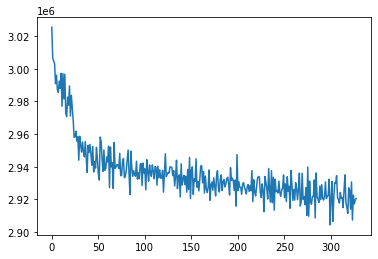

Validation


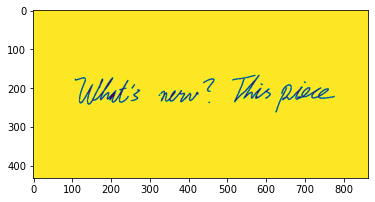

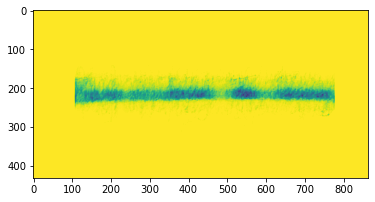

validation loss: 16655.267578125
Random


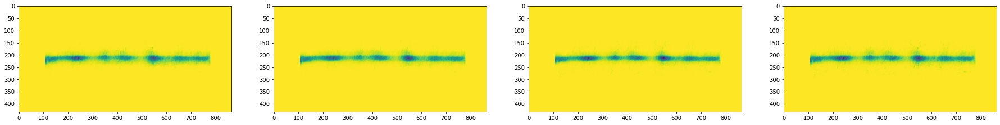

n_iter : 8275/46000, loss = 2925103.220000000, time_since: 8648.77
n_iter : 8300/46000, loss = 2914304.200000000, time_since: 8678.45
n_iter : 8325/46000, loss = 2923737.940000000, time_since: 8702.68
n_iter : 8350/46000, loss = 2910500.570000000, time_since: 8734.23
n_iter : 8375/46000, loss = 2924776.720000000, time_since: 8759.57
n_iter : 8400/46000, loss = 2920964.250000000, time_since: 8783.64
n_iter : 8425/46000, loss = 2917388.340000000, time_since: 8809.60
n_iter : 8450/46000, loss = 2922594.970000000, time_since: 8834.17
n_iter : 8475/46000, loss = 2918267.100000000, time_since: 8860.35
n_iter : 8500/46000, loss = 2916927.990000000, time_since: 8884.68


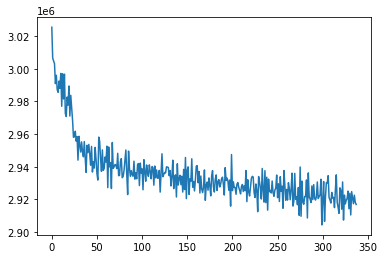

Validation


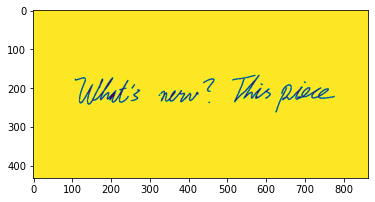

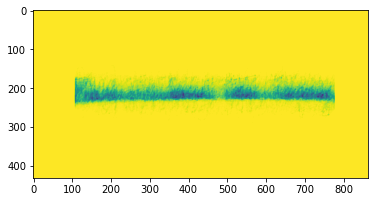

validation loss: 16791.751953125
Random


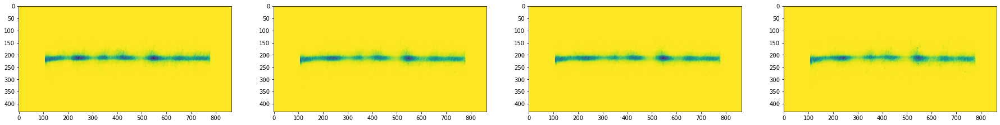

n_iter : 8525/46000, loss = 2925657.730000000, time_since: 8912.12
n_iter : 8550/46000, loss = 2912244.890000000, time_since: 8936.91
n_iter : 8575/46000, loss = 2934612.040000000, time_since: 8963.83
n_iter : 8600/46000, loss = 2915534.930000000, time_since: 8988.69
n_iter : 8625/46000, loss = 2914493.400000000, time_since: 9017.97
n_iter : 8650/46000, loss = 2924121.060000000, time_since: 9044.47
n_iter : 8675/46000, loss = 2918095.950000000, time_since: 9068.75
n_iter : 8700/46000, loss = 2919180.130000000, time_since: 9095.34
n_iter : 8725/46000, loss = 2919972.360000000, time_since: 9119.96
n_iter : 8750/46000, loss = 2920501.380000000, time_since: 9146.43


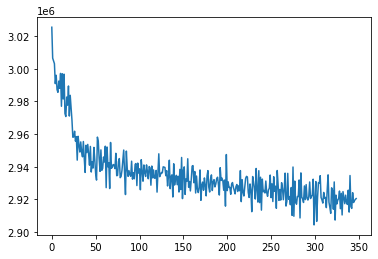

Validation


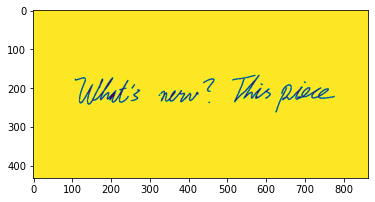

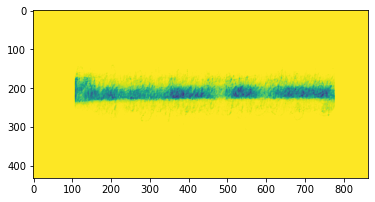

validation loss: 17285.060546875
Random


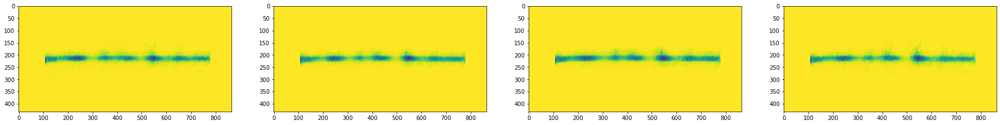

n_iter : 8775/46000, loss = 2921447.640000000, time_since: 9172.48
n_iter : 8800/46000, loss = 2913567.830000000, time_since: 9197.92
n_iter : 8825/46000, loss = 2920440.320000000, time_since: 9222.53
n_iter : 8850/46000, loss = 2919472.830000000, time_since: 9249.40
n_iter : 8875/46000, loss = 2915616.330000000, time_since: 9272.89
n_iter : 8900/46000, loss = 2918835.020000000, time_since: 9302.95
n_iter : 8925/46000, loss = 2918834.690000000, time_since: 9329.58
n_iter : 8950/46000, loss = 2921224.550000000, time_since: 9353.57
n_iter : 8975/46000, loss = 2923610.160000000, time_since: 9380.46
n_iter : 9000/46000, loss = 2919942.830000000, time_since: 9404.37


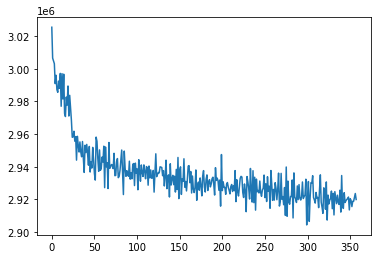

Validation


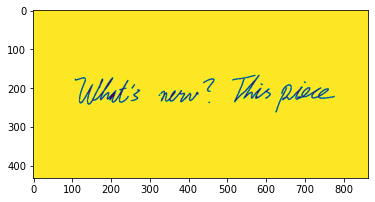

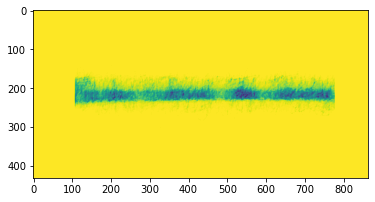

validation loss: 16708.427734375
Random


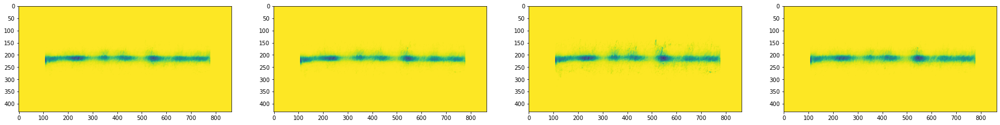

n_iter : 9025/46000, loss = 2921704.120000000, time_since: 9432.15
n_iter : 9050/46000, loss = 2921446.990000000, time_since: 9455.87
n_iter : 9075/46000, loss = 2915724.240000000, time_since: 9481.92
n_iter : 9100/46000, loss = 2917219.310000000, time_since: 9506.35
n_iter : 9125/46000, loss = 2923206.040000000, time_since: 9533.32
n_iter : 9150/46000, loss = 2914245.720000000, time_since: 9558.28
n_iter : 9175/46000, loss = 2915820.710000000, time_since: 9588.13
n_iter : 9200/46000, loss = 2920042.220000000, time_since: 9614.43
n_iter : 9225/46000, loss = 2916688.190000000, time_since: 9639.15
n_iter : 9250/46000, loss = 2912748.930000000, time_since: 9665.78


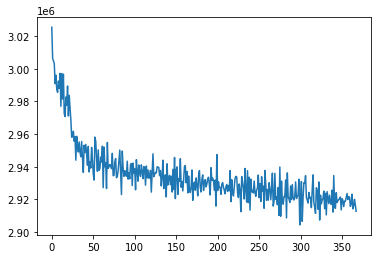

Validation


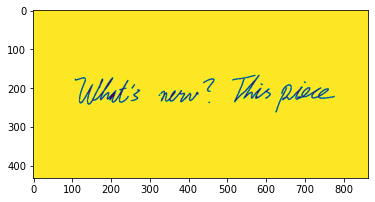

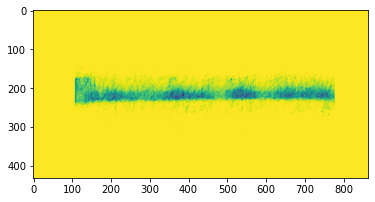

validation loss: 16696.65234375
Random


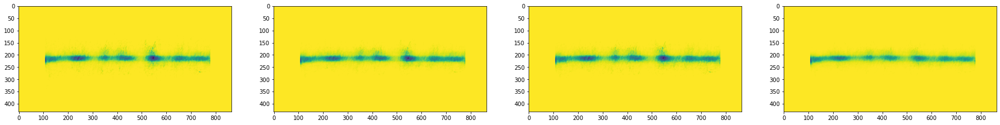

n_iter : 9275/46000, loss = 2921225.180000000, time_since: 9691.57
n_iter : 9300/46000, loss = 2918919.050000000, time_since: 9718.10
n_iter : 9325/46000, loss = 2909052.140000000, time_since: 9742.22
n_iter : 9350/46000, loss = 2908554.340000000, time_since: 9768.30
n_iter : 9375/46000, loss = 2912217.830000000, time_since: 9792.70
n_iter : 9400/46000, loss = 2924342.100000000, time_since: 9819.43
n_iter : 9425/46000, loss = 2916119.550000000, time_since: 9844.01
n_iter : 9450/46000, loss = 2916856.450000000, time_since: 9873.85
n_iter : 9475/46000, loss = 2918538.740000000, time_since: 9898.60
n_iter : 9500/46000, loss = 2917094.490000000, time_since: 9930.85


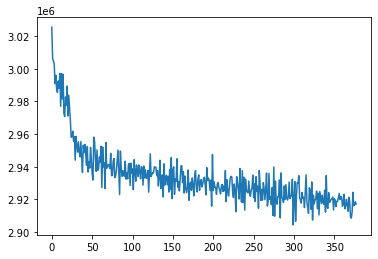

Validation


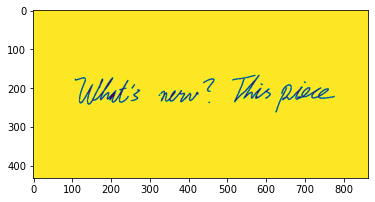

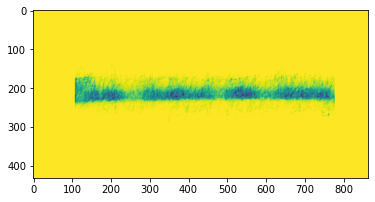

validation loss: 16721.462890625
Random


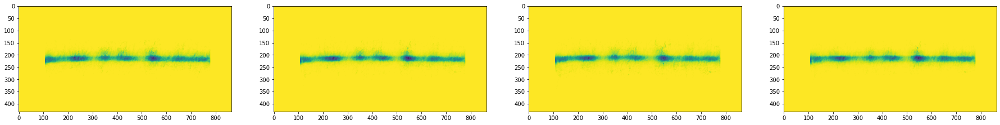

n_iter : 9525/46000, loss = 2912152.260000000, time_since: 9958.46
n_iter : 9550/46000, loss = 2914030.680000000, time_since: 9983.52
n_iter : 9575/46000, loss = 2919358.580000000, time_since: 10009.24
n_iter : 9600/46000, loss = 2912598.680000000, time_since: 10033.56
n_iter : 9625/46000, loss = 2921632.440000000, time_since: 10059.14
n_iter : 9650/46000, loss = 2922131.910000000, time_since: 10083.96
n_iter : 9675/46000, loss = 2911743.190000000, time_since: 10110.64
n_iter : 9700/46000, loss = 2923405.180000000, time_since: 10135.57
n_iter : 9725/46000, loss = 2914655.300000000, time_since: 10162.46
n_iter : 9750/46000, loss = 2919499.240000000, time_since: 10186.74


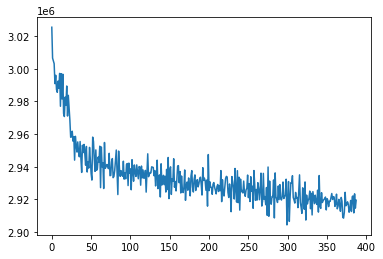

Validation


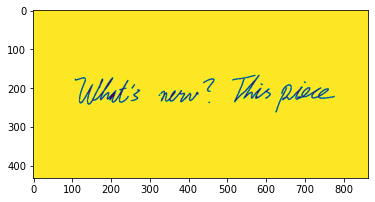

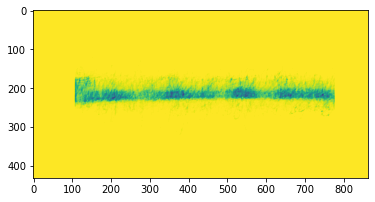

validation loss: 16955.79296875
Random


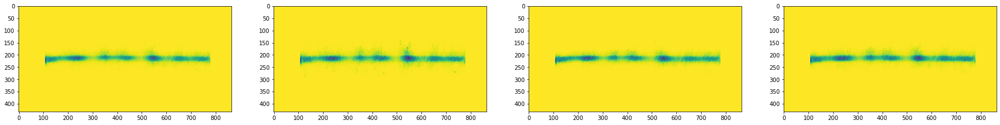

n_iter : 9775/46000, loss = 2916623.160000000, time_since: 10217.09
n_iter : 9800/46000, loss = 2917708.680000000, time_since: 10243.43
n_iter : 9825/46000, loss = 2917143.990000000, time_since: 10268.08
n_iter : 9850/46000, loss = 2917420.320000000, time_since: 10294.18
n_iter : 9875/46000, loss = 2912174.920000000, time_since: 10318.97
n_iter : 9900/46000, loss = 2911951.370000000, time_since: 10345.55
n_iter : 9925/46000, loss = 2916304.750000000, time_since: 10370.79
n_iter : 9950/46000, loss = 2919527.510000000, time_since: 10396.72
n_iter : 9975/46000, loss = 2912744.220000000, time_since: 10421.13
n_iter : 10000/46000, loss = 2911216.290000000, time_since: 10448.23


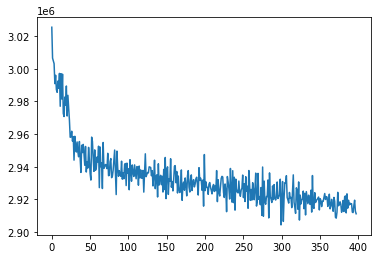

Validation


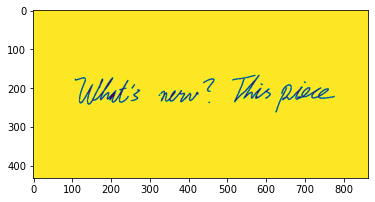

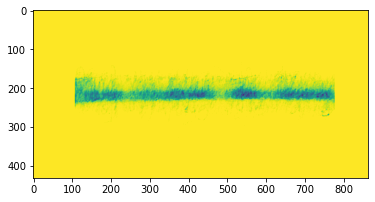

validation loss: 16666.595703125
Random


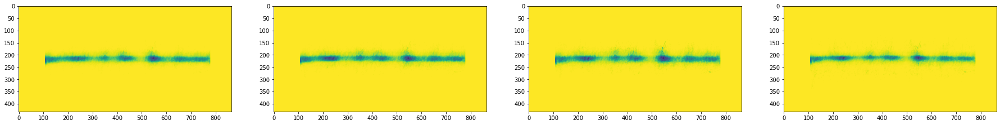

n_iter : 10025/46000, loss = 2924937.340000000, time_since: 10473.58
n_iter : 10050/46000, loss = 2911558.240000000, time_since: 10503.01
n_iter : 10075/46000, loss = 2921938.850000000, time_since: 10529.46
n_iter : 10100/46000, loss = 2916835.870000000, time_since: 10553.94
n_iter : 10125/46000, loss = 2920266.340000000, time_since: 10579.88
n_iter : 10150/46000, loss = 2920954.060000000, time_since: 10604.23
n_iter : 10175/46000, loss = 2910617.420000000, time_since: 10630.18
n_iter : 10200/46000, loss = 2916477.640000000, time_since: 10655.02
n_iter : 10225/46000, loss = 2915731.250000000, time_since: 10681.52
n_iter : 10250/46000, loss = 2913340.650000000, time_since: 10706.21


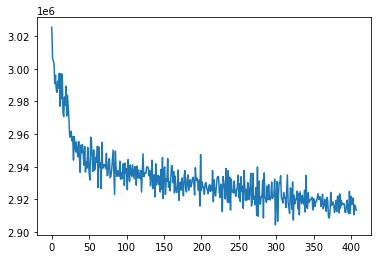

Validation


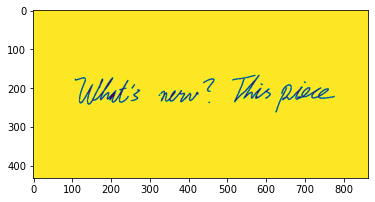

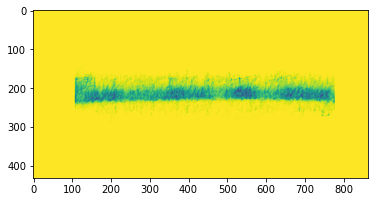

validation loss: 16789.08203125
Random


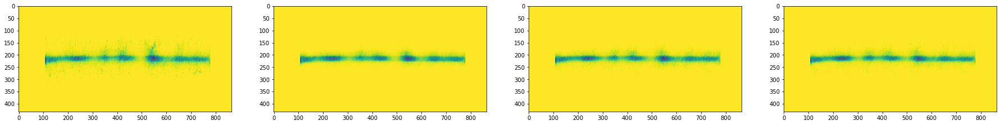

n_iter : 10275/46000, loss = 2922875.500000000, time_since: 10734.70
n_iter : 10300/46000, loss = 2907254.420000000, time_since: 10759.04
n_iter : 10325/46000, loss = 2912134.770000000, time_since: 10788.53
n_iter : 10350/46000, loss = 2922010.180000000, time_since: 10814.99
n_iter : 10375/46000, loss = 2905559.620000000, time_since: 10839.60
n_iter : 10400/46000, loss = 2927292.310000000, time_since: 10865.84
n_iter : 10425/46000, loss = 2918086.760000000, time_since: 10890.05
n_iter : 10450/46000, loss = 2910422.830000000, time_since: 10916.23
n_iter : 10475/46000, loss = 2912796.660000000, time_since: 10941.19
n_iter : 10500/46000, loss = 2909341.180000000, time_since: 10967.32


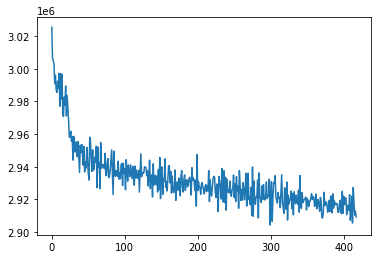

Validation


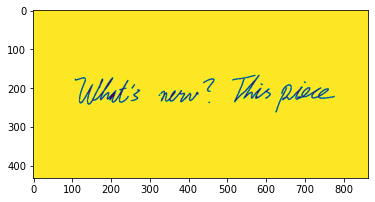

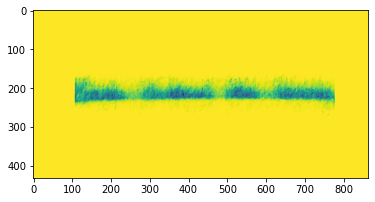

validation loss: 17292.564453125
Random


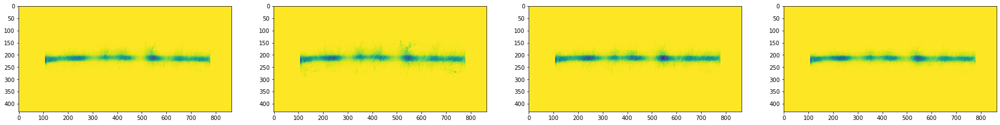

n_iter : 10525/46000, loss = 2911345.480000000, time_since: 10993.22
n_iter : 10550/46000, loss = 2916004.400000000, time_since: 11019.90
n_iter : 10575/46000, loss = 2917630.080000000, time_since: 11044.84
n_iter : 10600/46000, loss = 2916977.560000000, time_since: 11074.67
n_iter : 10625/46000, loss = 2912047.020000000, time_since: 11098.43
n_iter : 10650/46000, loss = 2912232.640000000, time_since: 11130.25
n_iter : 10675/46000, loss = 2920621.300000000, time_since: 11156.13
n_iter : 10700/46000, loss = 2920479.260000000, time_since: 11181.19
n_iter : 10725/46000, loss = 2927679.360000000, time_since: 11206.94
n_iter : 10750/46000, loss = 2909338.550000000, time_since: 11231.27


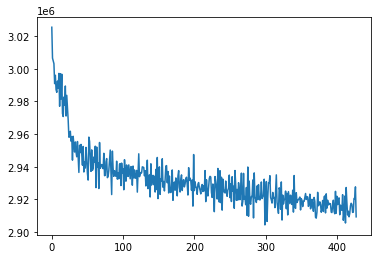

Validation


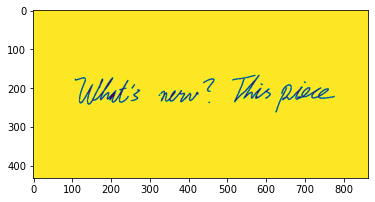

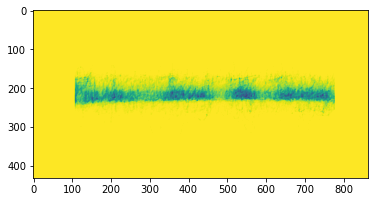

validation loss: 16573.1796875
Random


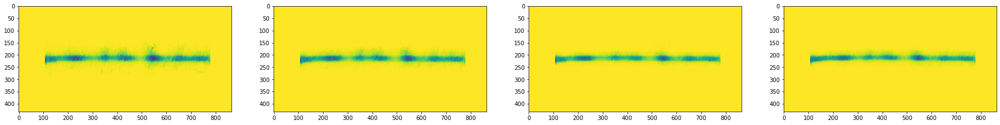

n_iter : 10775/46000, loss = 2903292.650000000, time_since: 11258.42
n_iter : 10800/46000, loss = 2916107.970000000, time_since: 11282.46
n_iter : 10825/46000, loss = 2909300.170000000, time_since: 11308.40
n_iter : 10850/46000, loss = 2919198.690000000, time_since: 11332.99
n_iter : 10875/46000, loss = 2907602.400000000, time_since: 11360.20
n_iter : 10900/46000, loss = 2916653.550000000, time_since: 11384.36
n_iter : 10925/46000, loss = 2917099.550000000, time_since: 11413.85
n_iter : 10950/46000, loss = 2910145.840000000, time_since: 11440.50
n_iter : 10975/46000, loss = 2911442.860000000, time_since: 11465.26
n_iter : 11000/46000, loss = 2914952.010000000, time_since: 11491.14


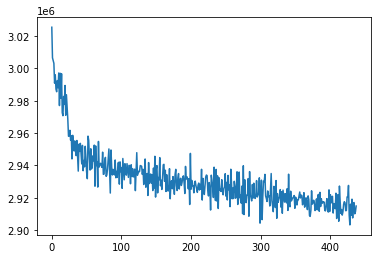

Validation


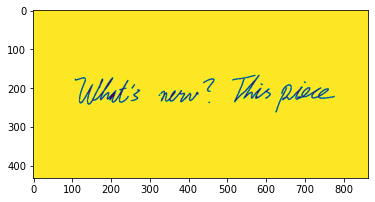

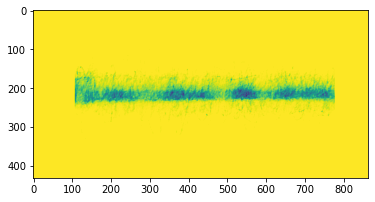

validation loss: 16666.60546875
Random


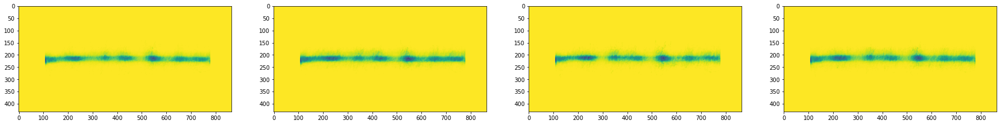

n_iter : 11025/46000, loss = 2918295.960000000, time_since: 11518.42
n_iter : 11050/46000, loss = 2896330.880000000, time_since: 11544.47
n_iter : 11075/46000, loss = 2922426.030000000, time_since: 11569.13
n_iter : 11100/46000, loss = 2907689.130000000, time_since: 11595.09
n_iter : 11125/46000, loss = 2926016.260000000, time_since: 11619.87
n_iter : 11150/46000, loss = 2905964.610000000, time_since: 11646.51
n_iter : 11175/46000, loss = 2920102.350000000, time_since: 11671.20
n_iter : 11200/46000, loss = 2910950.110000000, time_since: 11700.72
n_iter : 11225/46000, loss = 2920860.480000000, time_since: 11726.82
n_iter : 11250/46000, loss = 2901489.580000000, time_since: 11751.08


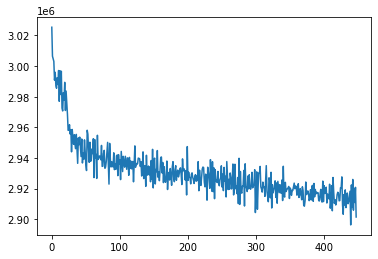

Validation


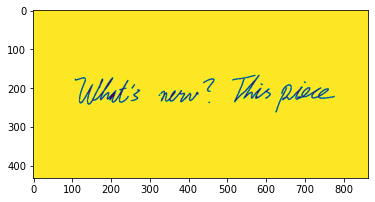

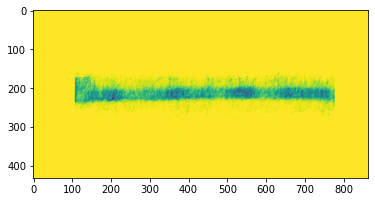

validation loss: 16979.541015625
Random


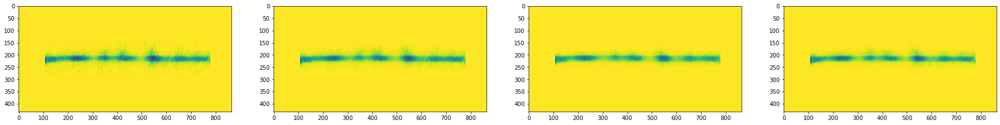

n_iter : 11275/46000, loss = 2919063.640000000, time_since: 11778.40
n_iter : 11300/46000, loss = 2920844.700000000, time_since: 11802.20
n_iter : 11325/46000, loss = 2914044.330000000, time_since: 11828.74
n_iter : 11350/46000, loss = 2909444.490000000, time_since: 11853.78
n_iter : 11375/46000, loss = 2903479.330000000, time_since: 11879.70
n_iter : 11400/46000, loss = 2927576.200000000, time_since: 11904.92
n_iter : 11425/46000, loss = 2913148.340000000, time_since: 11932.45
n_iter : 11450/46000, loss = 2914874.500000000, time_since: 11956.18
n_iter : 11475/46000, loss = 2915429.070000000, time_since: 11986.09
n_iter : 11500/46000, loss = 2911950.380000000, time_since: 12012.79


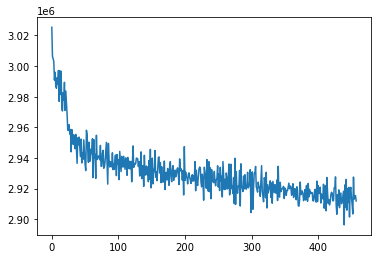

Validation


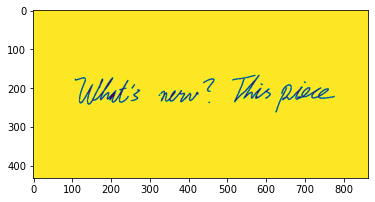

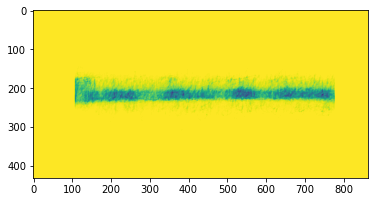

validation loss: 16766.244140625
Random


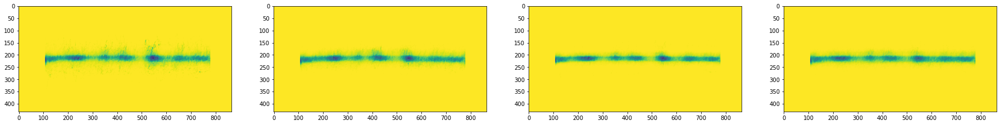

n_iter : 11525/46000, loss = 2904087.680000000, time_since: 12038.50
n_iter : 11550/46000, loss = 2919253.820000000, time_since: 12065.07
n_iter : 11575/46000, loss = 2909282.680000000, time_since: 12089.86
n_iter : 11600/46000, loss = 2919676.810000000, time_since: 12116.68
n_iter : 11625/46000, loss = 2900200.720000000, time_since: 12141.87
n_iter : 11650/46000, loss = 2918329.220000000, time_since: 12168.31
n_iter : 11675/46000, loss = 2907977.950000000, time_since: 12193.37
n_iter : 11700/46000, loss = 2907395.470000000, time_since: 12219.83
n_iter : 11725/46000, loss = 2917764.890000000, time_since: 12244.18
n_iter : 11750/46000, loss = 2911279.050000000, time_since: 12273.39


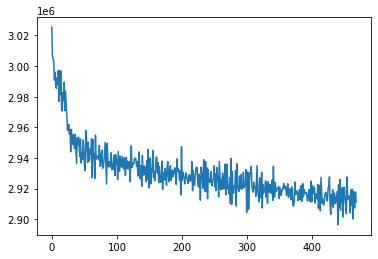

Validation


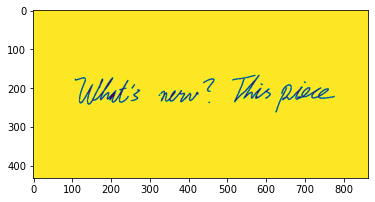

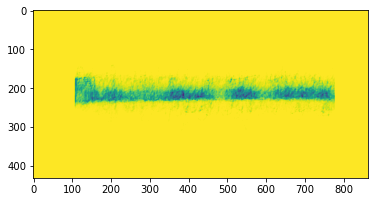

validation loss: 16687.3203125
Random


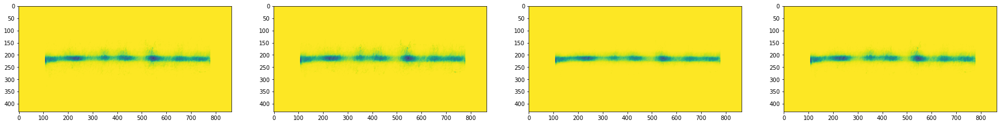

n_iter : 11775/46000, loss = 2906523.360000000, time_since: 12298.97
n_iter : 11800/46000, loss = 2915573.500000000, time_since: 12331.00
n_iter : 11825/46000, loss = 2911712.880000000, time_since: 12357.41
n_iter : 11850/46000, loss = 2905816.230000000, time_since: 12382.06
n_iter : 11875/46000, loss = 2909014.850000000, time_since: 12408.22
n_iter : 11900/46000, loss = 2914878.750000000, time_since: 12433.43
n_iter : 11925/46000, loss = 2904908.590000000, time_since: 12459.27
n_iter : 11950/46000, loss = 2909766.370000000, time_since: 12484.14
n_iter : 11975/46000, loss = 2918930.690000000, time_since: 12511.15
n_iter : 12000/46000, loss = 2915086.130000000, time_since: 12536.47


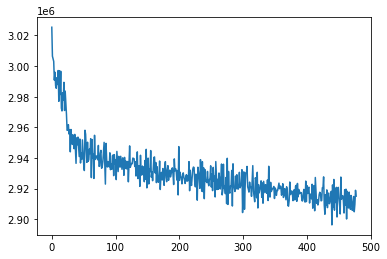

Validation


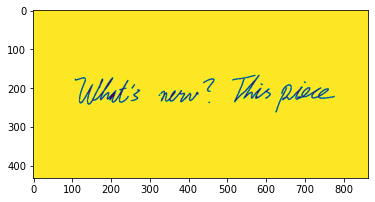

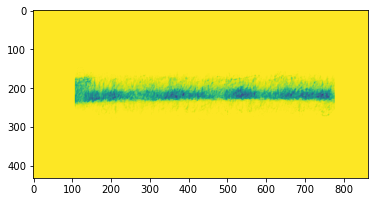

validation loss: 16723.798828125
Random


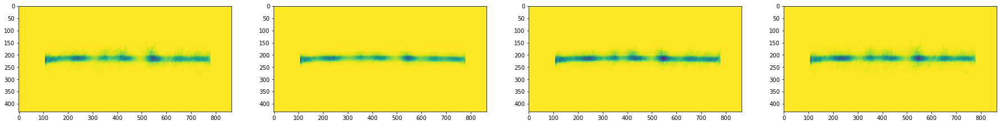

n_iter : 12025/46000, loss = 2906029.020000000, time_since: 12564.61
n_iter : 12050/46000, loss = 2916192.430000000, time_since: 12588.76
n_iter : 12075/46000, loss = 2923970.550000000, time_since: 12617.97
n_iter : 12100/46000, loss = 2904889.200000000, time_since: 12643.90
n_iter : 12125/46000, loss = 2903945.720000000, time_since: 12668.71
n_iter : 12150/46000, loss = 2906583.710000000, time_since: 12695.04
n_iter : 12175/46000, loss = 2905757.980000000, time_since: 12719.64
n_iter : 12200/46000, loss = 2911134.890000000, time_since: 12746.10
n_iter : 12225/46000, loss = 2921697.170000000, time_since: 12771.00
n_iter : 12250/46000, loss = 2901956.020000000, time_since: 12797.10


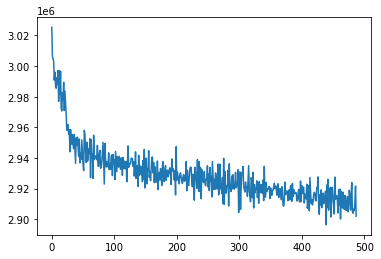

Validation


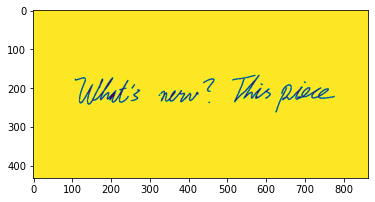

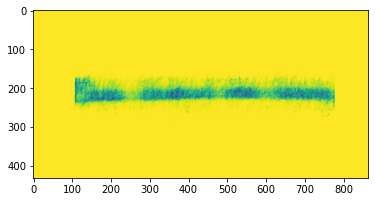

validation loss: 17269.73046875
Random


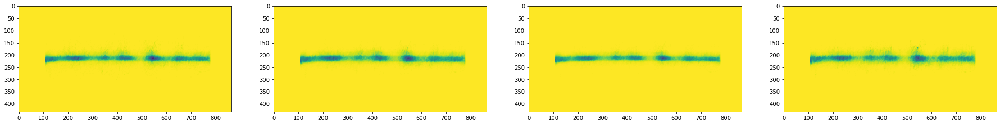

n_iter : 12275/46000, loss = 2910301.610000000, time_since: 12822.71
n_iter : 12300/46000, loss = 2914805.690000000, time_since: 12849.45
n_iter : 12325/46000, loss = 2914332.480000000, time_since: 12874.15
n_iter : 12350/46000, loss = 2914003.700000000, time_since: 12903.64
n_iter : 12375/46000, loss = 2906078.620000000, time_since: 12930.56
n_iter : 12400/46000, loss = 2905005.930000000, time_since: 12955.03
n_iter : 12425/46000, loss = 2909581.350000000, time_since: 12980.91
n_iter : 12450/46000, loss = 2909880.390000000, time_since: 13005.32
n_iter : 12475/46000, loss = 2904335.110000000, time_since: 13032.55
n_iter : 12500/46000, loss = 2917984.620000000, time_since: 13057.02


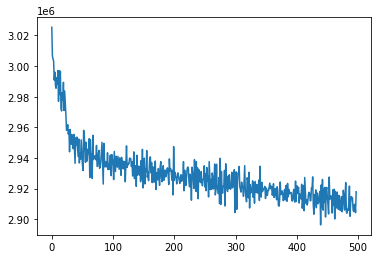

Validation


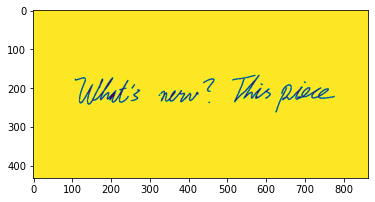

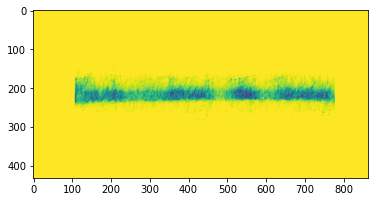

validation loss: 16512.326171875
Random


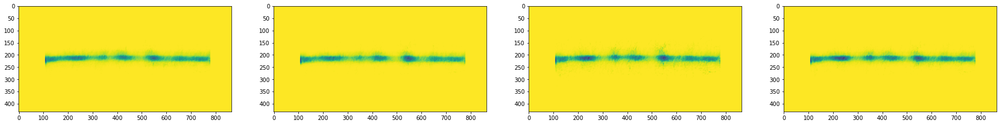

n_iter : 12525/46000, loss = 2900097.240000000, time_since: 13084.57
n_iter : 12550/46000, loss = 2916205.280000000, time_since: 13108.90
n_iter : 12575/46000, loss = 2910903.680000000, time_since: 13135.87
n_iter : 12600/46000, loss = 2912663.650000000, time_since: 13159.95
n_iter : 12625/46000, loss = 2902300.510000000, time_since: 13189.75
n_iter : 12650/46000, loss = 2917132.120000000, time_since: 13216.18
n_iter : 12675/46000, loss = 2911081.920000000, time_since: 13242.11
n_iter : 12700/46000, loss = 2902271.790000000, time_since: 13275.79
n_iter : 12725/46000, loss = 2906587.320000000, time_since: 13305.80
n_iter : 12750/46000, loss = 2917582.690000000, time_since: 13337.03


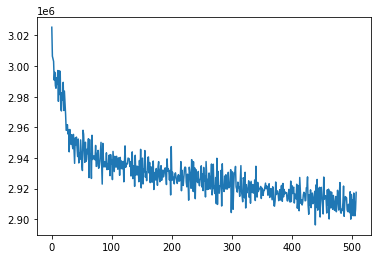

Validation


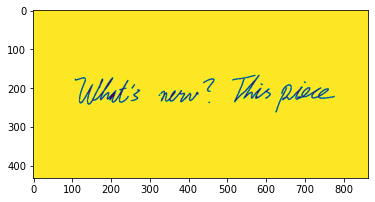

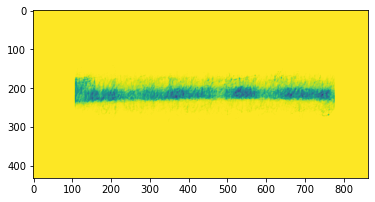

validation loss: 16825.208984375
Random


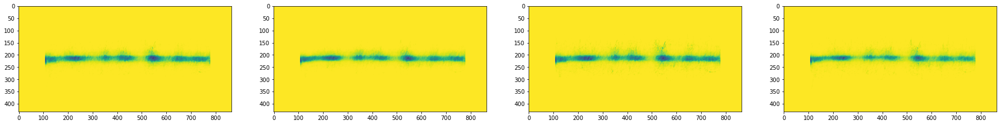

n_iter : 12775/46000, loss = 2902449.190000000, time_since: 13366.48
n_iter : 12800/46000, loss = 2908669.600000000, time_since: 13396.63
n_iter : 12825/46000, loss = 2915587.760000000, time_since: 13426.77
n_iter : 12850/46000, loss = 2901685.130000000, time_since: 13458.03
n_iter : 12875/46000, loss = 2913012.850000000, time_since: 13487.94
n_iter : 12900/46000, loss = 2916310.890000000, time_since: 13522.33
n_iter : 12925/46000, loss = 2907065.460000000, time_since: 13550.20
n_iter : 12950/46000, loss = 2907942.440000000, time_since: 13587.89
n_iter : 12975/46000, loss = 2916469.320000000, time_since: 13618.71
n_iter : 13000/46000, loss = 2897905.760000000, time_since: 13647.99


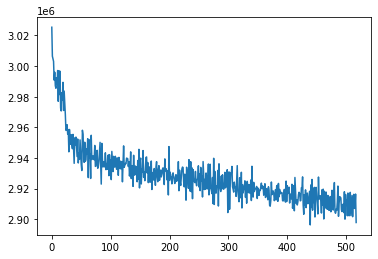

Validation


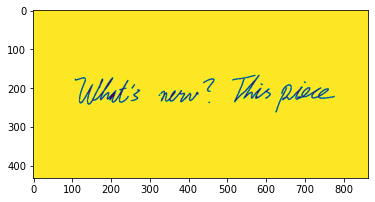

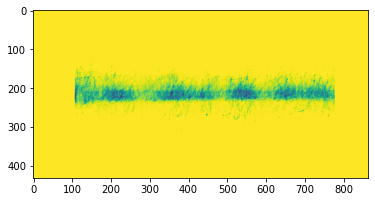

validation loss: 17145.884765625
Random


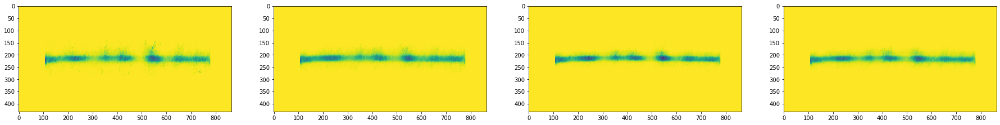

n_iter : 13025/46000, loss = 2910455.640000000, time_since: 13678.61
n_iter : 13050/46000, loss = 2915765.210000000, time_since: 13707.06
n_iter : 13075/46000, loss = 2907492.880000000, time_since: 13738.67
n_iter : 13100/46000, loss = 2903216.760000000, time_since: 13765.82
n_iter : 13125/46000, loss = 2914013.640000000, time_since: 13796.32
n_iter : 13150/46000, loss = 2901018.390000000, time_since: 13823.80
n_iter : 13175/46000, loss = 2912440.950000000, time_since: 13855.22
n_iter : 13200/46000, loss = 2907339.310000000, time_since: 13882.74
n_iter : 13225/46000, loss = 2907277.390000000, time_since: 13917.22
n_iter : 13250/46000, loss = 2906646.320000000, time_since: 13947.18


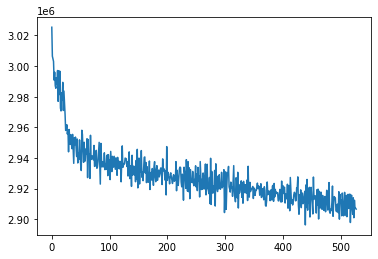

Validation


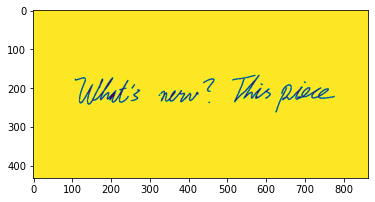

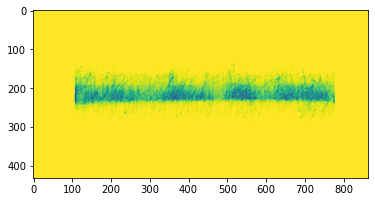

validation loss: 17234.15234375
Random


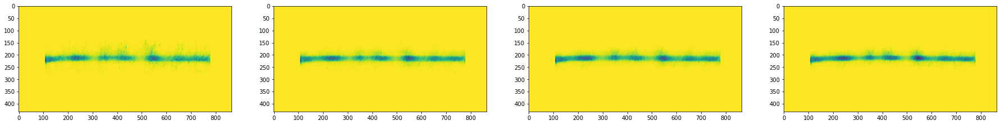

n_iter : 13275/46000, loss = 2908656.820000000, time_since: 13975.94
n_iter : 13300/46000, loss = 2910770.120000000, time_since: 14008.31
n_iter : 13325/46000, loss = 2905883.870000000, time_since: 14037.08
n_iter : 13350/46000, loss = 2905754.310000000, time_since: 14068.10
n_iter : 13375/46000, loss = 2915630.720000000, time_since: 14097.85
n_iter : 13400/46000, loss = 2905579.880000000, time_since: 14126.34
n_iter : 13425/46000, loss = 2904801.120000000, time_since: 14156.43
n_iter : 13450/46000, loss = 2910234.880000000, time_since: 14187.03
n_iter : 13475/46000, loss = 2915240.620000000, time_since: 14215.03
n_iter : 13500/46000, loss = 2911171.270000000, time_since: 14247.93


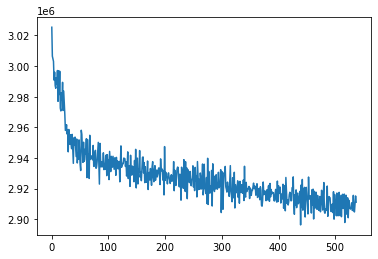

Validation


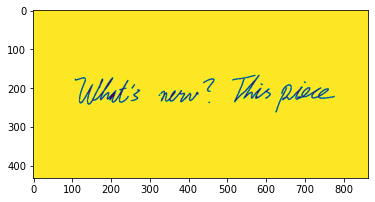

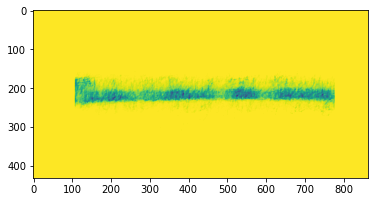

validation loss: 16834.232421875
Random


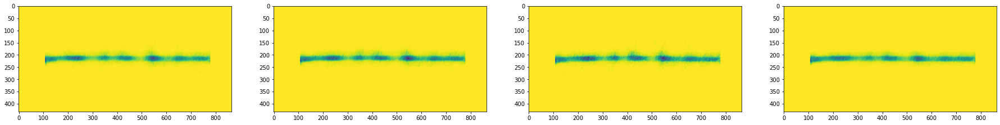

n_iter : 13525/46000, loss = 2908609.890000000, time_since: 14281.81
n_iter : 13550/46000, loss = 2902374.880000000, time_since: 14311.22
n_iter : 13575/46000, loss = 2906617.010000000, time_since: 14342.36
n_iter : 13600/46000, loss = 2901359.150000000, time_since: 14373.21
n_iter : 13625/46000, loss = 2910867.440000000, time_since: 14404.21
n_iter : 13650/46000, loss = 2913336.120000000, time_since: 14432.64
n_iter : 13675/46000, loss = 2904449.740000000, time_since: 14464.12
n_iter : 13700/46000, loss = 2912432.990000000, time_since: 14491.73
n_iter : 13725/46000, loss = 2899496.610000000, time_since: 14522.38
n_iter : 13750/46000, loss = 2906633.250000000, time_since: 14550.40


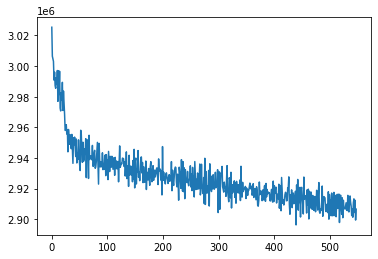

Validation


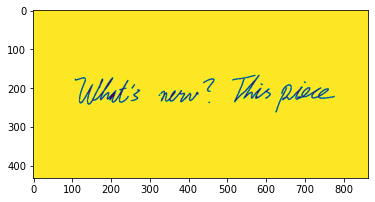

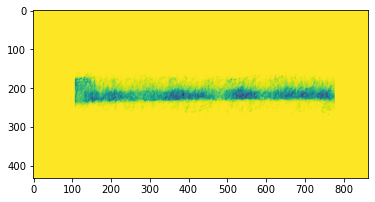

validation loss: 16608.63671875
Random


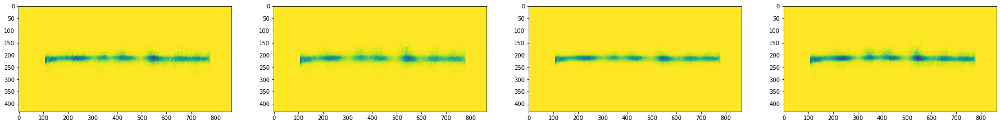

n_iter : 13775/46000, loss = 2912470.770000000, time_since: 14584.98
n_iter : 13800/46000, loss = 2898587.970000000, time_since: 14616.22
n_iter : 13825/46000, loss = 2906162.570000000, time_since: 14644.95
n_iter : 13850/46000, loss = 2912412.870000000, time_since: 14677.64
n_iter : 13875/46000, loss = 2904662.150000000, time_since: 14705.47
n_iter : 13900/46000, loss = 2907551.730000000, time_since: 14736.77
n_iter : 13925/46000, loss = 2909057.790000000, time_since: 14768.12
n_iter : 13950/46000, loss = 2898210.930000000, time_since: 14798.89
n_iter : 13975/46000, loss = 2911749.650000000, time_since: 14828.87
n_iter : 14000/46000, loss = 2903397.760000000, time_since: 14859.87


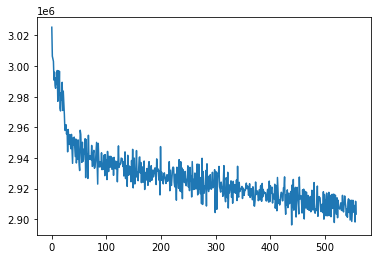

Validation


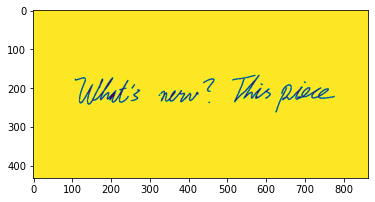

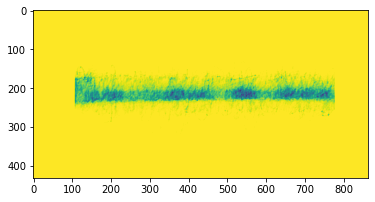

validation loss: 16549.34765625
Random


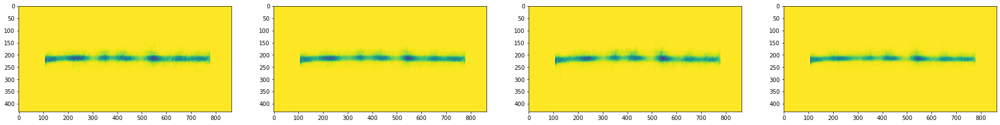

n_iter : 14025/46000, loss = 2905208.090000000, time_since: 14890.45
n_iter : 14050/46000, loss = 2905424.510000000, time_since: 14924.02
n_iter : 14075/46000, loss = 2904615.660000000, time_since: 14953.41
n_iter : 14100/46000, loss = 2910985.520000000, time_since: 14990.49
n_iter : 14125/46000, loss = 2895597.330000000, time_since: 15020.58
n_iter : 14150/46000, loss = 2899951.250000000, time_since: 15050.42
n_iter : 14175/46000, loss = 2910999.820000000, time_since: 15080.18
n_iter : 14200/46000, loss = 2912395.400000000, time_since: 15110.06
n_iter : 14225/46000, loss = 2907471.630000000, time_since: 15140.54
n_iter : 14250/46000, loss = 2901786.460000000, time_since: 15168.40


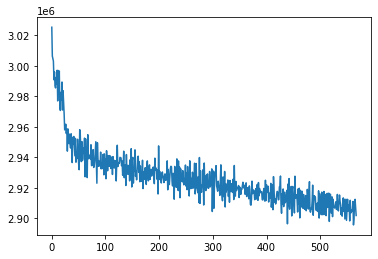

Validation


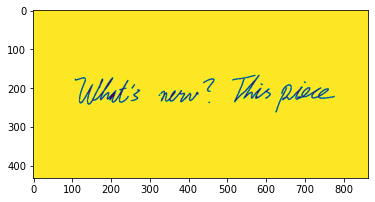

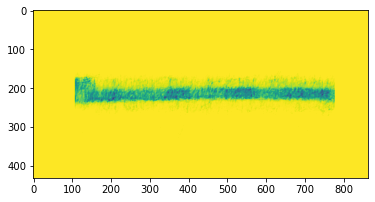

validation loss: 17146.65625
Random


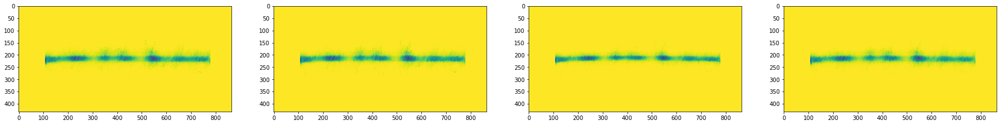

n_iter : 14275/46000, loss = 2905188.650000000, time_since: 15200.61
n_iter : 14300/46000, loss = 2906364.270000000, time_since: 15230.20
n_iter : 14325/46000, loss = 2909931.090000000, time_since: 15262.01
n_iter : 14350/46000, loss = 2902663.840000000, time_since: 15289.35
n_iter : 14375/46000, loss = 2904342.880000000, time_since: 15323.00
n_iter : 14400/46000, loss = 2905165.090000000, time_since: 15354.72
n_iter : 14425/46000, loss = 2900073.290000000, time_since: 15382.68
n_iter : 14450/46000, loss = 2909227.040000000, time_since: 15413.03
n_iter : 14475/46000, loss = 2901047.200000000, time_since: 15441.91
n_iter : 14500/46000, loss = 2906478.870000000, time_since: 15471.92


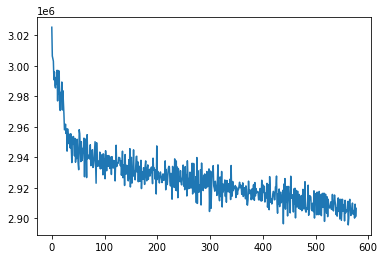

Validation


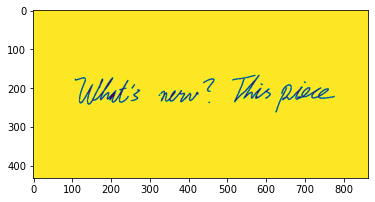

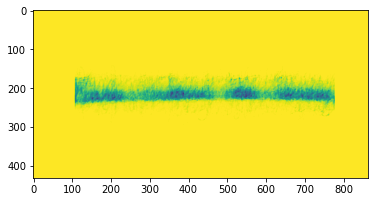

validation loss: 16738.46484375
Random


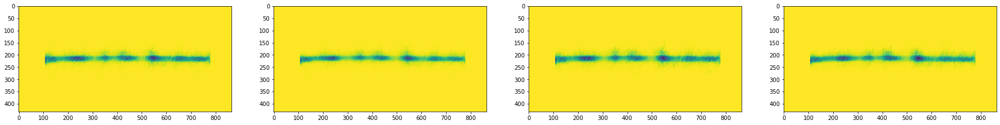

n_iter : 14525/46000, loss = 2908948.490000000, time_since: 15503.07
n_iter : 14550/46000, loss = 2908173.570000000, time_since: 15531.34
n_iter : 14575/46000, loss = 2905016.030000000, time_since: 15560.89
n_iter : 14600/46000, loss = 2904157.190000000, time_since: 15591.48
n_iter : 14625/46000, loss = 2907412.910000000, time_since: 15618.69
n_iter : 14650/46000, loss = 2904607.920000000, time_since: 15651.42
n_iter : 14675/46000, loss = 2901575.290000000, time_since: 15684.39
n_iter : 14700/46000, loss = 2903608.500000000, time_since: 15711.55
n_iter : 14725/46000, loss = 2902570.290000000, time_since: 15742.53
n_iter : 14750/46000, loss = 2915985.720000000, time_since: 15772.03


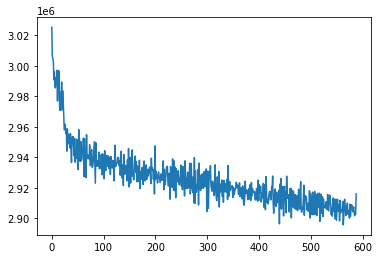

Validation


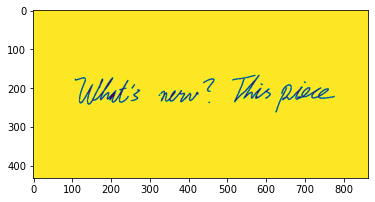

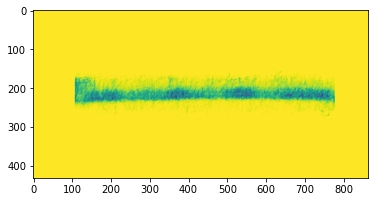

validation loss: 16931.216796875
Random


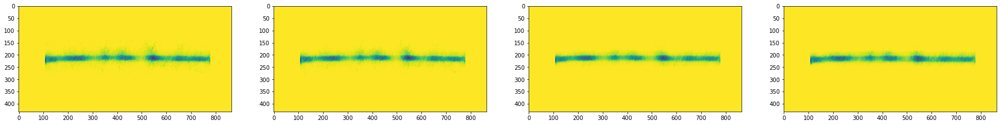

n_iter : 14775/46000, loss = 2904407.830000000, time_since: 15803.79
n_iter : 14800/46000, loss = 2913201.270000000, time_since: 15831.89
n_iter : 14825/46000, loss = 2894419.820000000, time_since: 15861.71
n_iter : 14850/46000, loss = 2909713.400000000, time_since: 15892.31
n_iter : 14875/46000, loss = 2900715.470000000, time_since: 15922.06
n_iter : 14900/46000, loss = 2905700.720000000, time_since: 15950.78
n_iter : 14925/46000, loss = 2895860.130000000, time_since: 15984.71
n_iter : 14950/46000, loss = 2916504.460000000, time_since: 16016.83
n_iter : 14975/46000, loss = 2901914.840000000, time_since: 16044.87
n_iter : 15000/46000, loss = 2915414.180000000, time_since: 16075.68


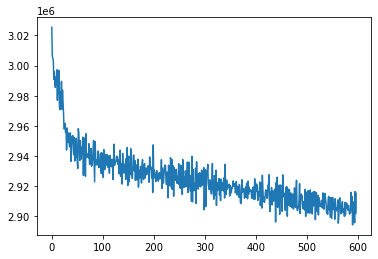

Validation


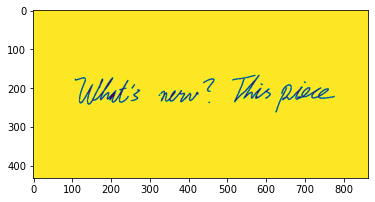

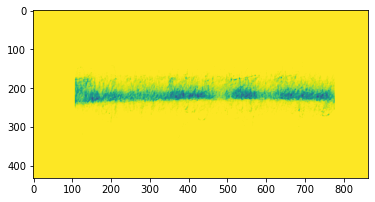

validation loss: 16681.3984375
Random


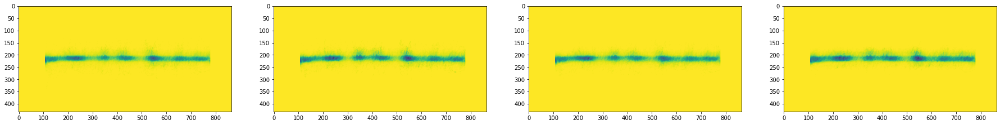

n_iter : 15025/46000, loss = 2905717.090000000, time_since: 16106.71
n_iter : 15050/46000, loss = 2905486.290000000, time_since: 16136.78
n_iter : 15075/46000, loss = 2906295.400000000, time_since: 16164.39
n_iter : 15100/46000, loss = 2897223.910000000, time_since: 16194.21
n_iter : 15125/46000, loss = 2898440.010000000, time_since: 16223.50
n_iter : 15150/46000, loss = 2905378.220000000, time_since: 16254.98
n_iter : 15175/46000, loss = 2910075.210000000, time_since: 16283.42
n_iter : 15200/46000, loss = 2902971.110000000, time_since: 16314.69
n_iter : 15225/46000, loss = 2904154.610000000, time_since: 16344.14
n_iter : 15250/46000, loss = 2904541.310000000, time_since: 16379.38


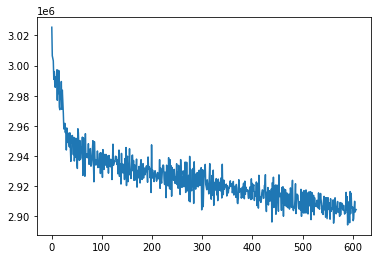

Validation


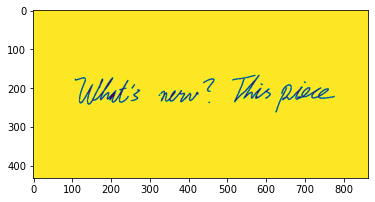

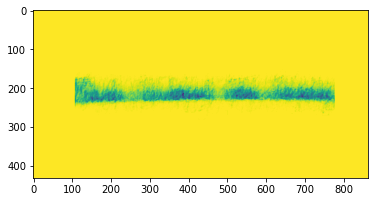

validation loss: 16952.771484375
Random


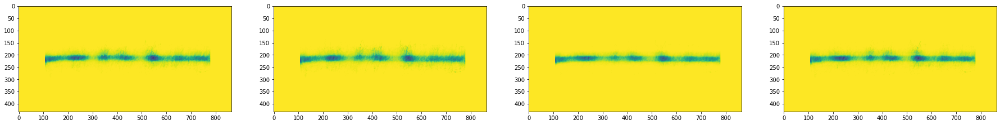

n_iter : 15275/46000, loss = 2899317.410000000, time_since: 16412.12
n_iter : 15300/46000, loss = 2912463.140000000, time_since: 16439.86
n_iter : 15325/46000, loss = 2890241.400000000, time_since: 16469.79
n_iter : 15350/46000, loss = 2902485.010000000, time_since: 16500.49
n_iter : 15375/46000, loss = 2904103.400000000, time_since: 16527.63
n_iter : 15400/46000, loss = 2904032.190000000, time_since: 16558.21
n_iter : 15425/46000, loss = 2901567.640000000, time_since: 16588.41
n_iter : 15450/46000, loss = 2914764.040000000, time_since: 16616.59
n_iter : 15475/46000, loss = 2890452.810000000, time_since: 16647.68
n_iter : 15500/46000, loss = 2910852.140000000, time_since: 16676.08


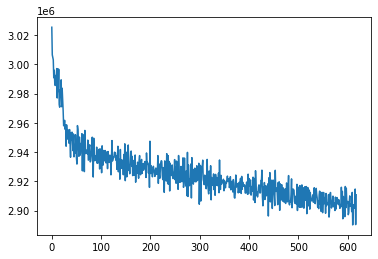

Validation


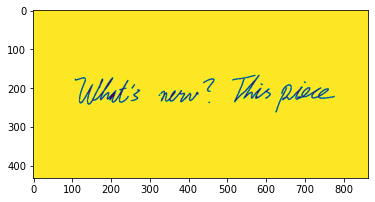

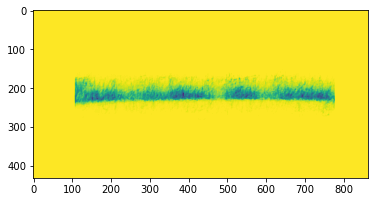

validation loss: 16966.345703125
Random


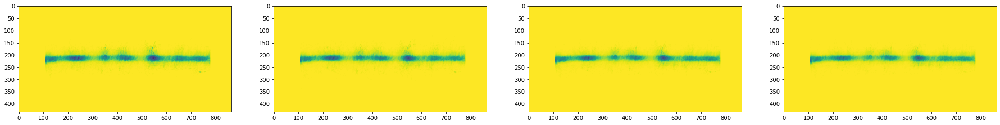

n_iter : 15525/46000, loss = 2897114.890000000, time_since: 16711.87
n_iter : 15550/46000, loss = 2912540.170000000, time_since: 16742.84
n_iter : 15575/46000, loss = 2901282.240000000, time_since: 16771.18
n_iter : 15600/46000, loss = 2899805.720000000, time_since: 16801.34
n_iter : 15625/46000, loss = 2907359.060000000, time_since: 16831.47
n_iter : 15650/46000, loss = 2892493.010000000, time_since: 16861.41
n_iter : 15675/46000, loss = 2908850.150000000, time_since: 16888.03
n_iter : 15700/46000, loss = 2904738.310000000, time_since: 16919.46
n_iter : 15725/46000, loss = 2904640.380000000, time_since: 16946.89
n_iter : 15750/46000, loss = 2901251.190000000, time_since: 16978.11


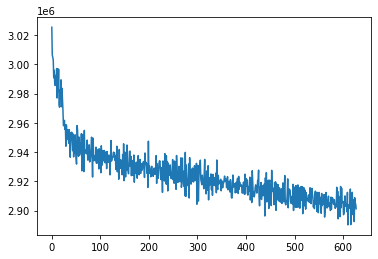

Validation


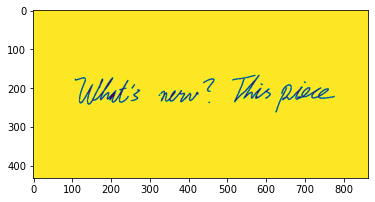

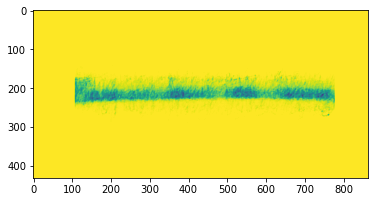

validation loss: 16895.80078125
Random


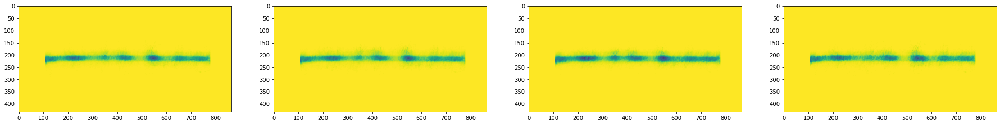

n_iter : 15775/46000, loss = 2899206.780000000, time_since: 17008.70
n_iter : 15800/46000, loss = 2909864.060000000, time_since: 17043.91
n_iter : 15825/46000, loss = 2900116.740000000, time_since: 17074.84
n_iter : 15850/46000, loss = 2902366.910000000, time_since: 17103.15
n_iter : 15875/46000, loss = 2899316.630000000, time_since: 17134.78
n_iter : 15900/46000, loss = 2900757.660000000, time_since: 17161.01
n_iter : 15925/46000, loss = 2902401.530000000, time_since: 17192.34
n_iter : 15950/46000, loss = 2898164.250000000, time_since: 17220.05
n_iter : 15975/46000, loss = 2903768.500000000, time_since: 17251.58
n_iter : 16000/46000, loss = 2897864.650000000, time_since: 17282.55


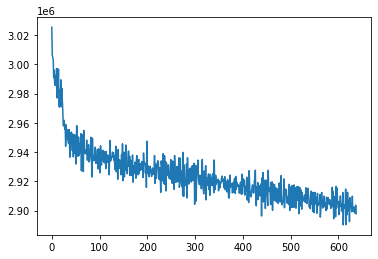

Validation


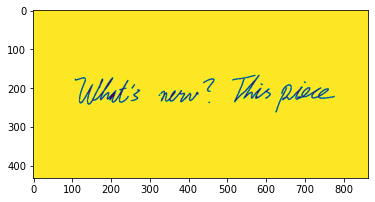

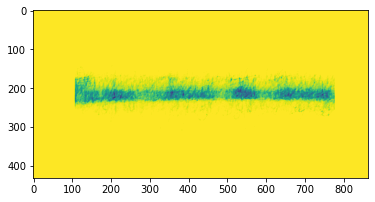

validation loss: 16633.876953125
Random


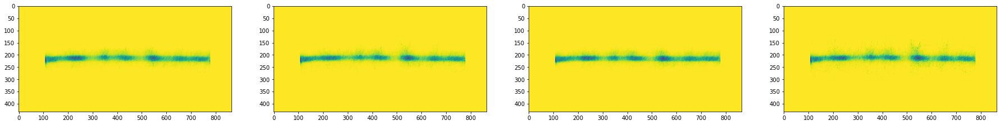

n_iter : 16025/46000, loss = 2905959.840000000, time_since: 17314.56
n_iter : 16050/46000, loss = 2898639.870000000, time_since: 17344.21
n_iter : 16075/46000, loss = 2908336.120000000, time_since: 17379.33
n_iter : 16100/46000, loss = 2894352.690000000, time_since: 17408.82
n_iter : 16125/46000, loss = 2895922.160000000, time_since: 17439.41
n_iter : 16150/46000, loss = 2907179.540000000, time_since: 17469.66
n_iter : 16175/46000, loss = 2902708.300000000, time_since: 17496.85
n_iter : 16200/46000, loss = 2908085.450000000, time_since: 17527.81
n_iter : 16225/46000, loss = 2889481.760000000, time_since: 17555.62
n_iter : 16250/46000, loss = 2918961.010000000, time_since: 17585.39


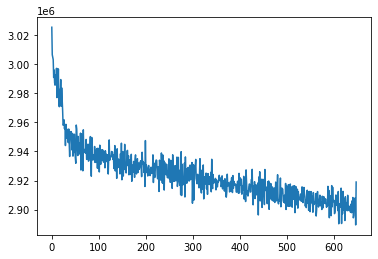

Validation


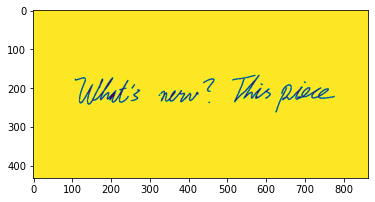

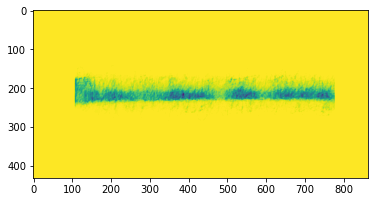

validation loss: 16681.4375
Random


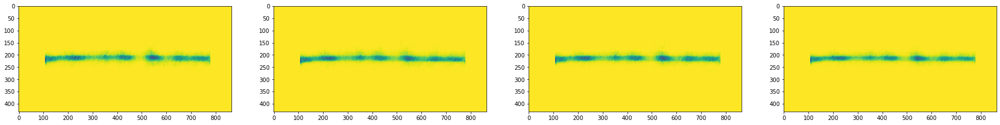

n_iter : 16275/46000, loss = 2899527.030000000, time_since: 17615.29
n_iter : 16300/46000, loss = 2908969.090000000, time_since: 17644.44
n_iter : 16325/46000, loss = 2899572.230000000, time_since: 17671.36
n_iter : 16350/46000, loss = 2906277.800000000, time_since: 17705.44
n_iter : 16375/46000, loss = 2897399.160000000, time_since: 17733.65
n_iter : 16400/46000, loss = 2894507.680000000, time_since: 17769.28
n_iter : 16425/46000, loss = 2910313.420000000, time_since: 17800.39
n_iter : 16450/46000, loss = 2900677.290000000, time_since: 17829.83
n_iter : 16475/46000, loss = 2900337.750000000, time_since: 17858.16
n_iter : 16500/46000, loss = 2891665.540000000, time_since: 17888.31


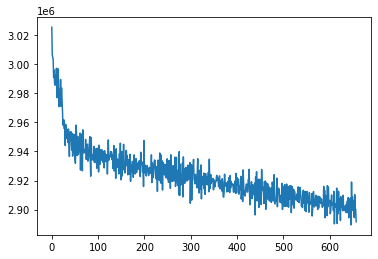

Validation


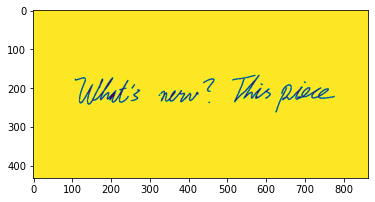

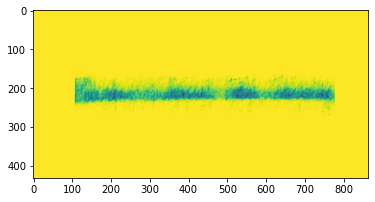

validation loss: 16681.447265625
Random


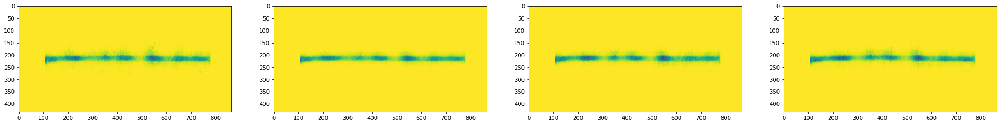

n_iter : 16525/46000, loss = 2902687.150000000, time_since: 17919.50
n_iter : 16550/46000, loss = 2905896.050000000, time_since: 17948.78
n_iter : 16575/46000, loss = 2895546.270000000, time_since: 17977.40
n_iter : 16600/46000, loss = 2911011.610000000, time_since: 18003.46
n_iter : 16625/46000, loss = 2898688.630000000, time_since: 18037.18
n_iter : 16650/46000, loss = 2909891.660000000, time_since: 18066.51
n_iter : 16675/46000, loss = 2898440.290000000, time_since: 18101.26
n_iter : 16700/46000, loss = 2897410.190000000, time_since: 18131.75
n_iter : 16725/46000, loss = 2895236.880000000, time_since: 18157.75
n_iter : 16750/46000, loss = 2912255.360000000, time_since: 18191.16


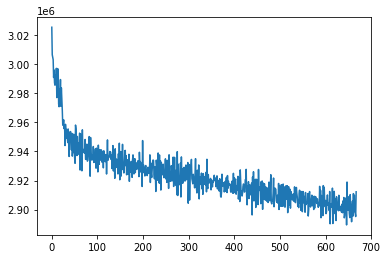

Validation


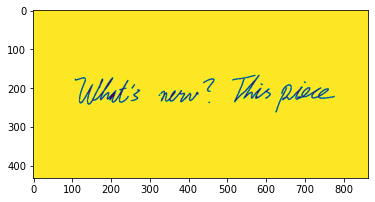

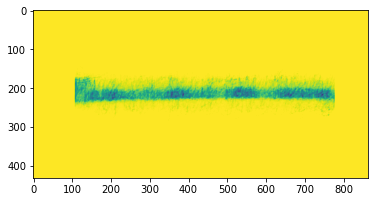

validation loss: 17100.736328125
Random


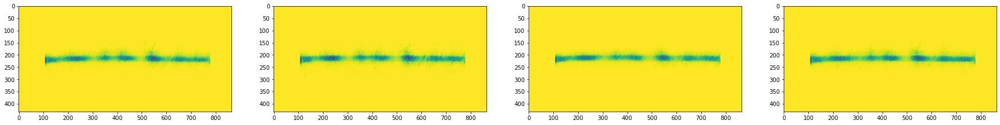

n_iter : 16775/46000, loss = 2906559.790000000, time_since: 18220.23
n_iter : 16800/46000, loss = 2889978.190000000, time_since: 18249.92
n_iter : 16825/46000, loss = 2896183.630000000, time_since: 18278.39
n_iter : 16850/46000, loss = 2894928.750000000, time_since: 18309.92
n_iter : 16875/46000, loss = 2899526.420000000, time_since: 18340.13
n_iter : 16900/46000, loss = 2905516.830000000, time_since: 18369.84
n_iter : 16925/46000, loss = 2903896.270000000, time_since: 18399.74
n_iter : 16950/46000, loss = 2896155.860000000, time_since: 18432.92
n_iter : 16975/46000, loss = 2900007.840000000, time_since: 18463.48
n_iter : 17000/46000, loss = 2898412.350000000, time_since: 18492.53


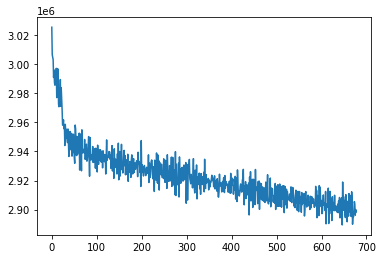

Validation


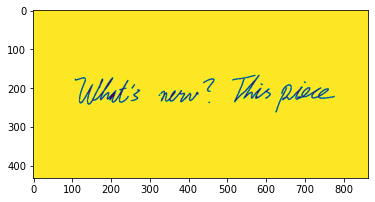

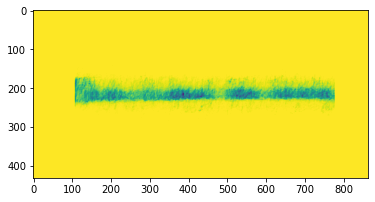

validation loss: 17082.9453125
Random


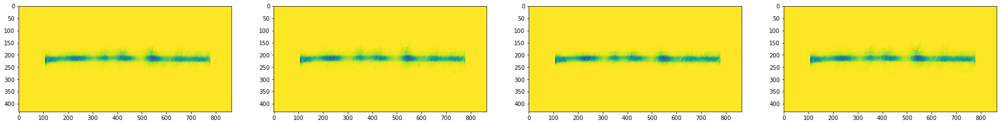

n_iter : 17025/46000, loss = 2901561.850000000, time_since: 18524.15
n_iter : 17050/46000, loss = 2889481.130000000, time_since: 18553.76
n_iter : 17075/46000, loss = 2911281.030000000, time_since: 18584.75
n_iter : 17100/46000, loss = 2900991.570000000, time_since: 18615.64
n_iter : 17125/46000, loss = 2881989.240000000, time_since: 18646.12
n_iter : 17150/46000, loss = 2907634.680000000, time_since: 18674.03
n_iter : 17175/46000, loss = 2900964.540000000, time_since: 18705.88
n_iter : 17200/46000, loss = 2905447.130000000, time_since: 18734.60
n_iter : 17225/46000, loss = 2900469.620000000, time_since: 18766.97
n_iter : 17250/46000, loss = 2896375.360000000, time_since: 18797.00


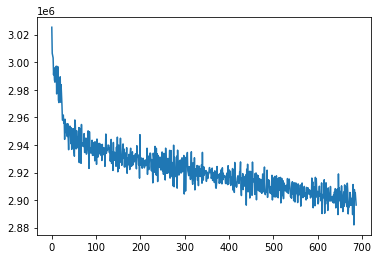

Validation


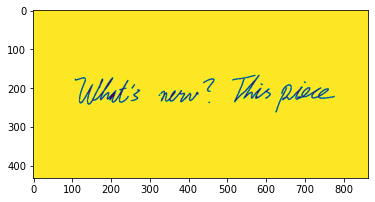

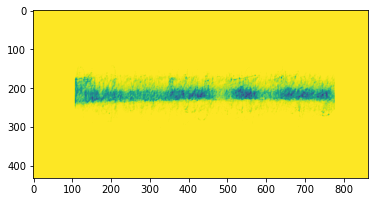

validation loss: 16526.23046875
Random


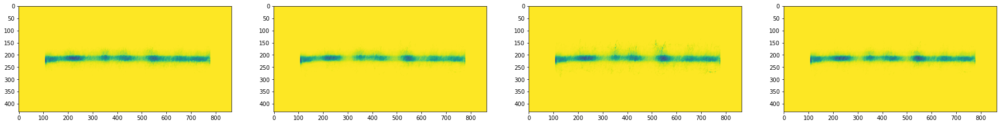

n_iter : 17275/46000, loss = 2906972.420000000, time_since: 18826.87
n_iter : 17300/46000, loss = 2890352.190000000, time_since: 18858.73
n_iter : 17325/46000, loss = 2890499.040000000, time_since: 18884.41
n_iter : 17350/46000, loss = 2902641.370000000, time_since: 18915.87
n_iter : 17375/46000, loss = 2896040.210000000, time_since: 18943.92
n_iter : 17400/46000, loss = 2895907.280000000, time_since: 18974.16


In [ ]:
def save_model(model):
    torch.save({
        'model_state_dict': model.state_dict(),
    }, base_dir + model_name)
    

for epoch in range(n_epochs):
    
    for batch_features, _ in train_dl:
        optimizer.zero_grad()
        batch_features = batch_features.to(device)
        batch_hat, mu, log_var = model(batch_features)
        train_loss = model.loss_fnc(batch_hat, batch_features, mu, log_var)
        train_loss.backward()
        optimizer.step()
        loss += train_loss.item()
        
        if n_iter % print_every == 0:
            loss /= print_every
            losses.append(loss)
            time_since = time.time() - start_time
            print(f"n_iter : {n_iter}/{total_iters}, loss = {loss:.9f}, time_since: {time_since:.2f}")
            loss = 0
            save_model(model)
            
        if n_iter % sample_every == 0:
            if len(losses) > 10:
                _=plt.plot(losses[3:])
                plt.show()
            for image, _ in valid_dl:
                image = image.to(device)
                _=model.sample(image)
        
        n_iter += 1
